In [1]:
from google.colab import drive
import os, textwrap, pprint, sys
drive.mount('/content/drive')
DRIVE_DATA_ROOT = "/content/drive/MyDrive/Colab_Datasets/Junior_project"
print("\nChecking DRIVE_DATA_ROOT:", DRIVE_DATA_ROOT)
if not os.path.exists(DRIVE_DATA_ROOT):
    print("ERROR: Path does not exist. Please (a) upload the dataset to Drive and (b) set DRIVE_DATA_ROOT to the correct folder.")
    print("List your MyDrive root here to help find it:")
    print(sorted(os.listdir("/content/drive/MyDrive"))[:200])
    raise SystemExit("Please update DRIVE_DATA_ROOT and re-run this cell.")
entries = sorted(os.listdir(DRIVE_DATA_ROOT))
print("\nEntries in DRIVE_DATA_ROOT (first 200):")
pprint.pprint(entries[:200])
zips = [f for f in entries if f.lower().endswith(('.zip','.tar','.tar.gz','.7z'))]
if zips:
    print("\nFound archive(s) in folder:")
    for z in zips:
        p = os.path.join(DRIVE_DATA_ROOT, z)
        print(" -", z, "size:", os.path.getsize(p)//(1024*1024), "MB")
candidate = None
possible = ["RGB-T wildfire dataset", "RGB-T wildfire dataset/", "RGB-T wildfire dataset (1)", "RGB-T wildfire dataset (copy)"]
for name in entries:
    if name.lower().startswith("rgb") or "wild" in name.lower() or "rgb-t" in name.lower() or "rgbt" in name.lower():
        candidate = name
        break

if candidate:
    dataset_path = os.path.join(DRIVE_DATA_ROOT, candidate)
    if os.path.isdir(dataset_path):
        print(f"\nFound likely dataset folder: {candidate}\nListing top-level files/folders inside it:")
        pprint.pprint(sorted(os.listdir(dataset_path))[:200])
    else:
        print(f"\nFound likely dataset file: {candidate} (not a folder). If this is a zip, we will unzip in Step 2.")
else:
    print("\nNo obvious dataset folder found automatically. If you uploaded a zip file, note the filename from the list above and tell me.")



Mounted at /content/drive

Checking DRIVE_DATA_ROOT: /content/drive/MyDrive/Colab_Datasets/Junior_project

Entries in DRIVE_DATA_ROOT (first 200):
['RGB-T wildfire dataset.zip']

Found archive(s) in folder:
 - RGB-T wildfire dataset.zip size: 778 MB

Found likely dataset file: RGB-T wildfire dataset.zip (not a folder). If this is a zip, we will unzip in Step 2.


In [2]:
from google.colab import drive
import zipfile, os, shutil
drive_root = "/content/drive/MyDrive"
zip_paths = []
for root, dirs, files in os.walk(drive_root):
    for f in files:
        if f.endswith(".zip"):
            zip_paths.append(os.path.join(root, f))

if not zip_paths:
    raise FileNotFoundError("No .zip files found anywhere in your Drive!")

print("Found ZIP files:")
for i, z in enumerate(zip_paths):
    print(f"[{i}] {z}")
zip_index = 0
zip_path = zip_paths[zip_index]
print(f"\n Using ZIP file: {zip_path}")
local_zip = "/content/RGB-T_wildfire_dataset.zip"
print("Copying to local storage...")
shutil.copy(zip_path, local_zip)
extract_path = "/content/RGB-T_wildfire_dataset"
os.makedirs(extract_path, exist_ok=True)

print("Unzipping locally...")
with zipfile.ZipFile(local_zip, 'r') as zip_ref:
    zip_ref.extractall(extract_path)
print("Extraction complete!")
print("\nExtracted folder contents:")
print(os.listdir(extract_path)[:20])


Found ZIP files:
[0] /content/drive/MyDrive/Portfolio/Front-end Projects/website project/frontEndExerciseProject.zip
[1] /content/drive/MyDrive/Colab_Datasets/Junior_project/RGB-T wildfire dataset.zip

 Using ZIP file: /content/drive/MyDrive/Portfolio/Front-end Projects/website project/frontEndExerciseProject.zip
Copying to local storage...
Unzipping locally...
Extraction complete!

Extracted folder contents:
['front-end-main']


In [3]:
BASE = "/content/RGB-T_wildfire_dataset"
RGB_DIR = os.path.join(BASE, "rgb")
NIR_DIR = os.path.join(BASE, "nir")
MASK_DIR = os.path.join(BASE, "mask")


In [4]:
!pip uninstall -y opencv-python-headless opencv-python albumentations ultralytics pycocotools shapely
!pip install -q ultralytics==8.0.149 pycocotools shapely tqdm matplotlib
!pip install -q albumentations==2.0.8 opencv-python-headless>=4.9.0.80
!pip install --upgrade pip
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121
!pip install tensorflow keras
!pip install opencv-python
!pip install scikit-image
!pip install imageio
!pip install pandas numpy h5py
!pip install matplotlib seaborn plotly
!pip install tqdm pillow albumentations
!pip install ultralytics


Found existing installation: opencv-python-headless 4.12.0.88
Uninstalling opencv-python-headless-4.12.0.88:
  Successfully uninstalled opencv-python-headless-4.12.0.88
Found existing installation: opencv-python 4.12.0.88
Uninstalling opencv-python-4.12.0.88:
  Successfully uninstalled opencv-python-4.12.0.88
Found existing installation: albumentations 2.0.8
Uninstalling albumentations-2.0.8:
  Successfully uninstalled albumentations-2.0.8
Found existing installation: pycocotools 2.0.10
Uninstalling pycocotools-2.0.10:
  Successfully uninstalled pycocotools-2.0.10
Found existing installation: shapely 2.1.2
Uninstalling shapely-2.1.2:
  Successfully uninstalled shapely-2.1.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 614.4/614.4 kB 21.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 397.1/397.1 kB 29.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 100.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 MB 12.3 MB/s eta 0:00:0

In [5]:
ZIP_PATH="/content/drive/MyDrive/Colab_Datasets/Junior_project/RGB-T wildfire dataset.zip"
EXTRACT_PATH="/content/rgbt3m"
!mkdir -p $EXTRACT_PATH
!unzip -q "$ZIP_PATH" -d $EXTRACT_PATH
!echo "Top-level folders/files in extracted dataset:"
!ls -la $EXTRACT_PATH


Top-level folders/files in extracted dataset:
total 12
drwxr-xr-x 3 root root 4096 Nov  5 13:11  .
drwxr-xr-x 1 root root 4096 Nov  5 13:11  ..
drwxr-xr-x 5 root root 4096 Nov 27  2023 'RGB-T wildfire dataset'


In [6]:
import os

BASE = "/content/rgbt3m/RGB-T wildfire dataset"
folders = ["rgb", "nir", "mask"]

for f in folders:
    path = os.path.join(BASE, f)
    files = sorted([file for file in os.listdir(path) if not file.startswith('.')])
    print(f"{f} folder -> {len(files)} files, first 5 files: {files[:5]}")


rgb folder -> 1367 files, first 5 files: ['100A_gt.png', '100E_gt.png', '100F_gt.png', '100_gt.png', '101A_gt.png']
nir folder -> 1367 files, first 5 files: ['100A_gt.png', '100E_gt.png', '100F_gt.png', '100_gt.png', '101A_gt.png']
mask folder -> 1367 files, first 5 files: ['100A_gt.png', '100E_gt.png', '100F_gt.png', '100_gt.png', '101A_gt.png']


In [7]:
import cv2, numpy as np
BASE="/content/rgbt3m/RGB-T wildfire dataset"
rgb_dir = os.path.join(BASE,"rgb")
nir_dir = os.path.join(BASE,"nir")
mask_dir = os.path.join(BASE,"mask")

def safe_list(d):
    return sorted([f for f in os.listdir(d) if not f.startswith('.')]) if os.path.exists(d) else []
rgb = safe_list(rgb_dir)
nir = safe_list(nir_dir)
masks = safe_list(mask_dir)
print("Counts -> rgb:", len(rgb), "nir:", len(nir), "mask:", len(masks))
print("First 5 rgb files:", rgb[:5])
print("First 5 mask files:", masks[:5])
if masks:
    sample = os.path.join(mask_dir, masks[0])
    m = cv2.imread(sample, cv2.IMREAD_UNCHANGED)
    print("Sample mask file:", masks[0], "shape:", None if m is None else m.shape, "unique values:", None if m is None else np.unique(m))
else:
    print("No mask files found. Check BASE path.")


Counts -> rgb: 1367 nir: 1367 mask: 1367
First 5 rgb files: ['100A_gt.png', '100E_gt.png', '100F_gt.png', '100_gt.png', '101A_gt.png']
First 5 mask files: ['100A_gt.png', '100E_gt.png', '100F_gt.png', '100_gt.png', '101A_gt.png']
Sample mask file: 100A_gt.png shape: (512, 640) unique values: [  0 255]


In [8]:
from tqdm import tqdm
BASE = "/content/rgbt3m/RGB-T wildfire dataset"
rgb_dir = os.path.join(BASE, "rgb")
nir_dir = os.path.join(BASE, "nir")
mask_dir = os.path.join(BASE, "mask")
all_files = sorted(os.listdir(rgb_dir))
print(f"Found {len(all_files)} samples")
rgb_images, nir_images, mask_images = [], [], []
for f in tqdm(all_files, desc="Loading all samples"):
    rgb_path = os.path.join(rgb_dir, f)
    nir_path = os.path.join(nir_dir, f)
    mask_path = os.path.join(mask_dir, f)
    rgb = cv2.imread(rgb_path)
    if rgb is None:
        print(f"Skipping missing RGB file: {f}")
        continue
    rgb = cv2.cvtColor(rgb, cv2.COLOR_BGR2RGB)

    nir = cv2.imread(nir_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    if nir is None or mask is None:
        print(f" Skipping incomplete sample: {f}")
        continue

    rgb_images.append(rgb)
    nir_images.append(nir)
    mask_images.append(mask)

print("\n All images loaded successfully!")
print(f"Total valid samples: {len(rgb_images)}")
unique_sizes = set([img.shape for img in rgb_images])
print(f"Unique RGB image sizes: {unique_sizes}")
print(f"NIR example shape: {nir_images[0].shape}")
print(f"Mask example shape: {mask_images[0].shape}")
print(f"Example mask unique values: {np.unique(mask_images[0])}")


Found 1367 samples


Loading all samples: 100%|██████████| 1367/1367 [00:22<00:00, 61.93it/s]


 All images loaded successfully!
Total valid samples: 1367
Unique RGB image sizes: {(420, 420, 3), (512, 640, 3)}
NIR example shape: (512, 640)
Mask example shape: (512, 640)
Example mask unique values: [  0 255]


In [9]:
import albumentations as A
import torch
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
BASE = "/content/rgbt3m/RGB-T wildfire dataset"
RGB_DIR = os.path.join(BASE, "rgb")
NIR_DIR = os.path.join(BASE, "nir")
MASK_DIR = os.path.join(BASE, "mask")
IMG_SIZE = (512, 640)
train_transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.3),
    A.RandomRotate90(p=0.5),
    A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=0.4),
    A.GaussianBlur(blur_limit=(3,7), p=0.3),
    A.Resize(height=IMG_SIZE[0], width=IMG_SIZE[1]),
    A.Normalize(mean=(0.485,0.456,0.406,0.5), std=(0.229,0.224,0.225,0.25))
])

val_transform = A.Compose([
    A.Resize(height=IMG_SIZE[0], width=IMG_SIZE[1]),
    A.Normalize(mean=(0.485,0.456,0.406,0.5), std=(0.229,0.224,0.225,0.25))
])
class RGBTWildfireDataset(Dataset):
    def __init__(self, rgb_dir, nir_dir, mask_dir, filenames=None, transform=None):
        self.rgb_dir = rgb_dir
        self.nir_dir = nir_dir
        self.mask_dir = mask_dir
        self.filenames = sorted(filenames) if filenames else sorted(os.listdir(rgb_dir))
        self.transform = transform

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        filename = self.filenames[idx]
        rgb = cv2.imread(os.path.join(self.rgb_dir, filename))
        rgb = cv2.cvtColor(rgb, cv2.COLOR_BGR2RGB)
        nir = cv2.imread(os.path.join(self.nir_dir, filename), cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(os.path.join(self.mask_dir, filename), cv2.IMREAD_GRAYSCALE)
        mask = (mask > 127).astype(np.float32)
        nir = np.expand_dims(nir, axis=-1)
        img_4ch = np.concatenate([rgb, nir], axis=-1)
        if self.transform:
            rgb_part = img_4ch[..., :3]
            augmented = self.transform(image=rgb_part, mask=mask)
            rgb_aug = augmented['image']
            mask = augmented['mask']
            nir_part = cv2.resize(nir, (rgb_aug.shape[1], rgb_aug.shape[0]), interpolation=cv2.INTER_LINEAR)
            nir_part = np.expand_dims(nir_part, axis=-1)
            img_4ch = np.concatenate([rgb_aug, nir_part], axis=-1)
        img_4ch = torch.from_numpy(img_4ch.transpose(2,0,1)).float()
        mask = torch.from_numpy(mask).unsqueeze(0).float()
        return img_4ch, mask
all_filenames = sorted(os.listdir(RGB_DIR))
train_files, val_files = train_test_split(all_filenames, test_size=0.2, random_state=42)


train_dataset = RGBTWildfireDataset(RGB_DIR, NIR_DIR, MASK_DIR, filenames=train_files, transform=train_transform)
val_dataset   = RGBTWildfireDataset(RGB_DIR, NIR_DIR, MASK_DIR, filenames=val_files, transform=val_transform)


train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=0)
val_loader   = DataLoader(val_dataset, batch_size=4, shuffle=False, num_workers=0)


images, masks = next(iter(train_loader))
print(f"Batch images shape: {images.shape}  # Expect [B,4,H,W]")
print(f"Batch masks shape: {masks.shape}    # Expect [B,1,H,W]")
print(f"Mask unique values in batch: {torch.unique(masks)}")


Batch images shape: torch.Size([4, 4, 512, 640])  # Expect [B,4,H,W]
Batch masks shape: torch.Size([4, 1, 512, 640])    # Expect [B,1,H,W]
Mask unique values in batch: tensor([0., 1.])


In [10]:
BASE = "/content/rgbt3m/RGB-T wildfire dataset"
RGB_DIR = os.path.join(BASE, "rgb")

all_files = sorted(os.listdir(RGB_DIR))
sample_files = all_files[:]
print("Selected files:", sample_files)


Selected files: ['100A_gt.png', '100E_gt.png', '100F_gt.png', '100_gt.png', '101A_gt.png', '101E_gt.png', '101F_gt.png', '101_gt.png', '102A_gt.png', '102E_gt.png', '102F_gt.png', '102_gt.png', '103A_gt.png', '103E_gt.png', '103F_gt.png', '103_gt.png', '104A_gt.png', '104E_gt.png', '104F_gt.png', '104_gt.png', '105A_gt.png', '105E_gt.png', '105F_gt.png', '105_gt.png', '106A_gt.png', '106E_gt.png', '106F_gt.png', '106_gt.png', '107A_gt.png', '107E_gt.png', '107F_gt.png', '107_gt.png', '108A_gt.png', '108E_gt.png', '108F_gt.png', '108_gt.png', '109A_gt.png', '109E_gt.png', '109F_gt.png', '109_gt.png', '10A_gt.png', '10C_gt.png', '10D_gt.png', '10E_gt.png', '10F_gt.png', '10_gt.png', '110A_gt.png', '110E_gt.png', '110F_gt.png', '110_gt.png', '111A_gt.png', '111E_gt.png', '111F_gt.png', '111_gt.png', '112A_gt.png', '112E_gt.png', '112F_gt.png', '112_gt.png', '113A_gt.png', '113E_gt.png', '113F_gt.png', '113_gt.png', '114A_gt.png', '114E_gt.png', '114F_gt.png', '114_gt.png', '115A_gt.png', 

In [11]:
from sklearn.model_selection import train_test_split

BASE = "/content/rgbt3m/RGB-T wildfire dataset"
RGB_DIR = os.path.join(BASE, "rgb")
MASK_DIR = os.path.join(BASE, "mask")

all_files = sorted(os.listdir(RGB_DIR))
print(f"Total RGB images: {len(all_files)}")
labels = []
for f in tqdm(all_files, desc="Analyzing masks for stratified split"):
    mask_path = os.path.join(MASK_DIR, f)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    if mask is None:
        print(f"Missing mask for {f}")
        continue
    has_fire = (mask > 127).any()
    labels.append(int(has_fire))

labels = np.array(labels)
print(f" Fire images: {np.sum(labels)} |  Non-fire images: {len(labels) - np.sum(labels)}")
train_files, val_files = train_test_split(
    all_files,
    test_size=0.2,
    random_state=42,
    stratify=labels
)

print(f"Train size: {len(train_files)}, Val size: {len(val_files)}")


Total RGB images: 1367


Analyzing masks for stratified split: 100%|██████████| 1367/1367 [00:00<00:00, 1437.71it/s]

 Fire images: 1298 |  Non-fire images: 69
Train size: 1093, Val size: 274


In [12]:
train_dataset = RGBTWildfireDataset(RGB_DIR, os.path.join(BASE, "nir"), MASK_DIR,
                                    filenames=train_files, transform=train_transform)
val_dataset   = RGBTWildfireDataset(RGB_DIR, os.path.join(BASE, "nir"), MASK_DIR,
                                    filenames=val_files, transform=val_transform)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=4, pin_memory=True)
val_loader   = DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers=4, pin_memory=True)




/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [13]:
images, masks = next(iter(train_loader))
print(f"Batch images shape: {images.shape}  # Expect [B,4,H,W]")
print(f"Batch masks shape: {masks.shape}    # Expect [B,1,H,W]")
print(f"Mask unique values in batch: {torch.unique(masks)}")


Batch images shape: torch.Size([8, 4, 512, 640])  # Expect [B,4,H,W]
Batch masks shape: torch.Size([8, 1, 512, 640])    # Expect [B,1,H,W]
Mask unique values in batch: tensor([0., 1.])


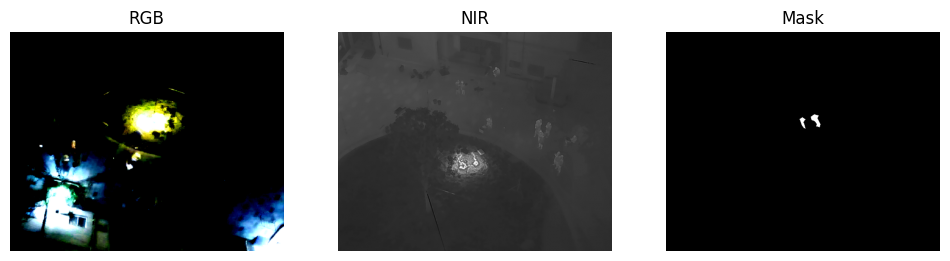

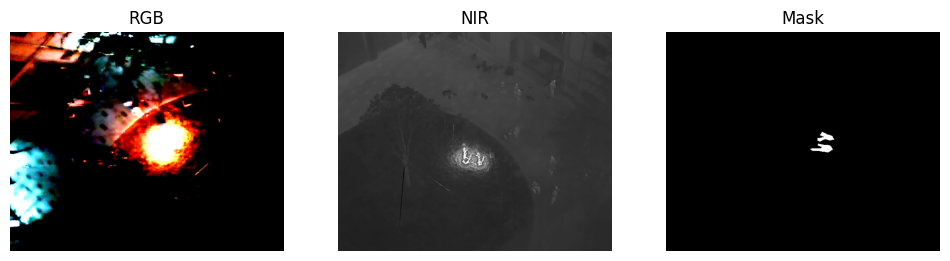

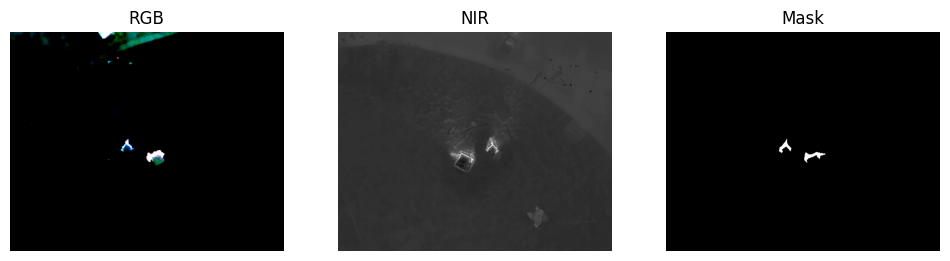

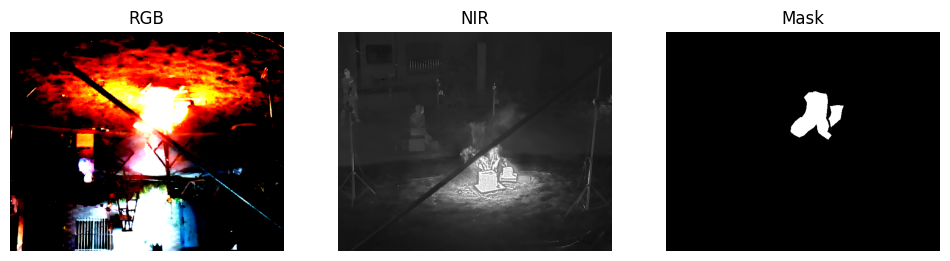

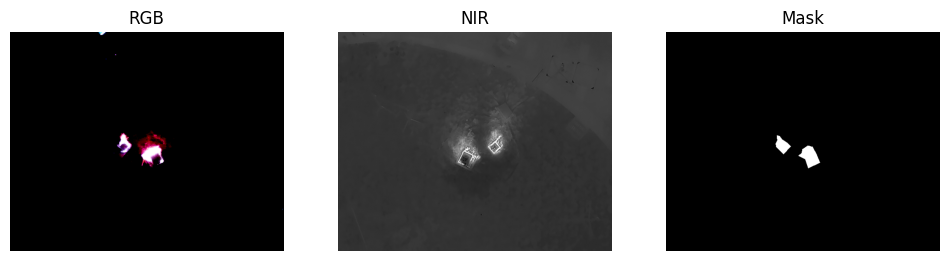

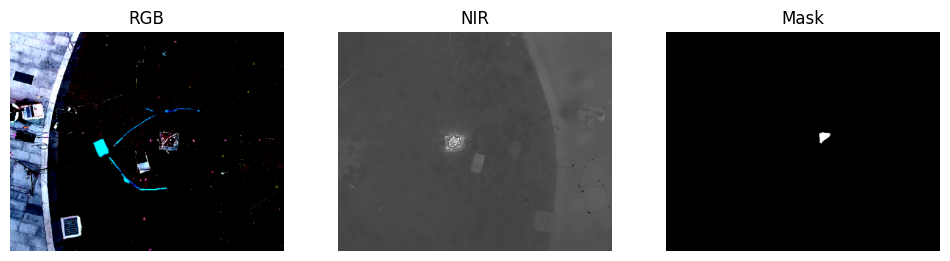

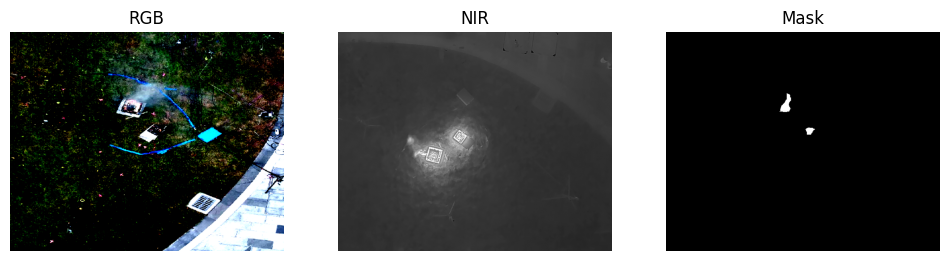

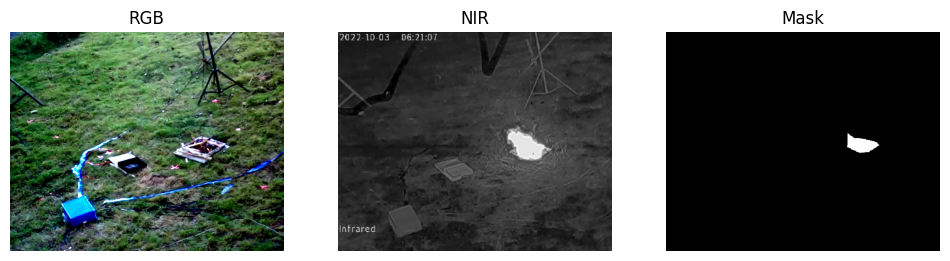

In [14]:
import matplotlib.pyplot as plt

for i in range(len(images)):
    plt.figure(figsize=(12,4))
    plt.subplot(1,3,1); plt.imshow(images[i][:3].permute(1,2,0)); plt.title("RGB"); plt.axis('off')
    plt.subplot(1,3,2); plt.imshow(images[i][3].cpu(), cmap='gray'); plt.title("NIR"); plt.axis('off')
    plt.subplot(1,3,3); plt.imshow(masks[i][0].cpu(), cmap='gray'); plt.title("Mask"); plt.axis('off')
    plt.show()


In [15]:
BASE = "/content/rgbt3m/RGB-T wildfire dataset"
RGB_DIR = os.path.join(BASE, "rgb")
NIR_DIR = os.path.join(BASE, "nir")
MASK_DIR = os.path.join(BASE, "mask")
IMG_SIZE = (512,640)
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"


In [16]:
train_transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.3),
    A.RandomRotate90(p=0.5),
    A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=0.4),
    A.GaussianBlur(blur_limit=(3,7), p=0.3),
    A.Resize(height=IMG_SIZE[0], width=IMG_SIZE[1]),
    A.Normalize(mean=(0.485,0.456,0.406,0.5), std=(0.229,0.224,0.225,0.25))
])

val_transform = A.Compose([
    A.Resize(height=IMG_SIZE[0], width=IMG_SIZE[1]),
    A.Normalize(mean=(0.485,0.456,0.406,0.5), std=(0.229,0.224,0.225,0.25))
])


In [17]:
class RGBTWildfireDataset(Dataset):
    def __init__(self, rgb_dir, nir_dir, mask_dir, filenames, transform=None):
        self.rgb_dir = rgb_dir
        self.nir_dir = nir_dir
        self.mask_dir = mask_dir
        self.filenames = filenames
        self.transform = transform

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        fname = self.filenames[idx]
        rgb = cv2.imread(os.path.join(self.rgb_dir, fname))
        rgb = cv2.cvtColor(rgb, cv2.COLOR_BGR2RGB)
        nir = cv2.imread(os.path.join(self.nir_dir, fname), cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(os.path.join(self.mask_dir, fname), cv2.IMREAD_GRAYSCALE)
        mask = (mask > 127).astype(np.float32)
        nir = np.expand_dims(nir, -1)
        img_4ch = np.concatenate([rgb, nir], axis=-1)

        if self.transform:
            rgb_part = img_4ch[..., :3]
            aug = self.transform(image=rgb_part, mask=mask)
            rgb_aug = aug['image']
            mask = aug['mask']
            nir_part = cv2.resize(nir, (rgb_aug.shape[1], rgb_aug.shape[0]), interpolation=cv2.INTER_LINEAR)
            nir_part = np.expand_dims(nir_part, -1)
            img_4ch = np.concatenate([rgb_aug, nir_part], axis=-1)

        img_4ch = torch.from_numpy(img_4ch.transpose(2,0,1)).float()
        mask = torch.from_numpy(mask).unsqueeze(0).float()
        return img_4ch, mask


In [18]:
all_files = sorted(os.listdir(RGB_DIR))
print(f"Found {len(all_files)} total samples")

train_files, temp_files = train_test_split(all_files, test_size=0.2, random_state=42)
val_files, test_files = train_test_split(temp_files, test_size=0.5, random_state=42)

print(f"Train: {len(train_files)} | Val: {len(val_files)} | Test: {len(test_files)}")

train_dataset = RGBTWildfireDataset(RGB_DIR, NIR_DIR, MASK_DIR, filenames=train_files, transform=train_transform)
val_dataset   = RGBTWildfireDataset(RGB_DIR, NIR_DIR, MASK_DIR, filenames=val_files, transform=val_transform)
test_dataset  = RGBTWildfireDataset(RGB_DIR, NIR_DIR, MASK_DIR, filenames=test_files, transform=val_transform)

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=0)
val_loader   = DataLoader(val_dataset, batch_size=2, shuffle=False, num_workers=0)
test_loader  = DataLoader(test_dataset, batch_size=2, shuffle=False, num_workers=0)

images, masks = next(iter(train_loader))
print(f" Batch images shape: {images.shape}")
print(f" Batch masks shape: {masks.shape}")
print(f"Mask unique values: {torch.unique(masks)}")


Found 1367 total samples
Train: 1093 | Val: 137 | Test: 137
 Batch images shape: torch.Size([4, 4, 512, 640])
 Batch masks shape: torch.Size([4, 1, 512, 640])
Mask unique values: tensor([0., 1.])


In [ ]:
import torch, torch.nn as nn, torch.optim as optim
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, jaccard_score

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.backends.cudnn.benchmark = True
print(" Device:", DEVICE)


class FocalLoss(nn.Module):
    def __init__(self, alpha=0.25, gamma=2):
        super().__init__()
        self.alpha, self.gamma = alpha, gamma
        self.bce = nn.BCEWithLogitsLoss(reduction='none')
    def forward(self, pred, target):
        bce_loss = self.bce(pred, target)
        pt = torch.exp(-bce_loss)
        return (self.alpha * (1 - pt) ** self.gamma * bce_loss).mean()

class DiceLoss(nn.Module):
    def __init__(self, smooth=1):
        super().__init__()
        self.smooth = smooth
    def forward(self, pred, target):
        pred = torch.sigmoid(pred)
        intersection = (pred * target).sum()
        return 1 - (2 * intersection + self.smooth) / (pred.sum() + target.sum() + self.smooth)

class ComboLoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.focal = FocalLoss()
        self.dice = DiceLoss()
    def forward(self, pred, target):
        return 0.5 * self.focal(pred, target) + 0.5 * self.dice(pred, target)

criterion = ComboLoss()


class DoubleConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1), nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1), nn.ReLU(inplace=True)
        )
    def forward(self, x): return self.block(x)

class UNet(nn.Module):
    def __init__(self, in_ch=4, out_ch=1):
        super().__init__()
        self.down1 = DoubleConv(in_ch, 64)
        self.down2 = DoubleConv(64, 128)
        self.down3 = DoubleConv(128, 256)
        self.down4 = DoubleConv(256, 512)
        self.pool = nn.MaxPool2d(2)
        self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.up3 = DoubleConv(512 + 256, 256)
        self.up2 = DoubleConv(256 + 128, 128)
        self.up1 = DoubleConv(128 + 64, 64)
        self.out = nn.Conv2d(64, out_ch, 1)
    def forward(self, x):
        x1 = self.down1(x)
        x2 = self.down2(self.pool(x1))
        x3 = self.down3(self.pool(x2))
        x4 = self.down4(self.pool(x3))
        x = self.up(x4)
        x = self.up3(torch.cat([x3, x], dim=1))
        x = self.up(x)
        x = self.up2(torch.cat([x2, x], dim=1))
        x = self.up(x)
        x = self.up1(torch.cat([x1, x], dim=1))
        return self.out(x)

model = UNet().to(DEVICE)
optimizer = optim.Adam(model.parameters(), lr=5e-4)

def sigmoid_bin(x): return (torch.sigmoid(x) > 0.5).float()

def dice_metric(p, t):
    p = sigmoid_bin(p)
    return (2 * (p * t).sum() + 1e-6) / (p.sum() + t.sum() + 1e-6)

def iou_metric(p, t):
    p = sigmoid_bin(p)
    inter = (p * t).sum()
    union = p.sum() + t.sum() - inter
    return (inter + 1e-6) / (union + 1e-6)

def compute_sklearn_metrics(p, t):
    p, t = p.flatten(), t.flatten()
    if p.sum() == 0 and t.sum() == 0:
        return 1, 1, 1, 1
    return (
        accuracy_score(t, p),
        precision_score(t, p, zero_division=0),
        recall_score(t, p, zero_division=0),
        f1_score(t, p, zero_division=0),
        jaccard_score(t, p, zero_division=0)
    )


num_epochs, patience = 100, 15
best_dice, no_improve = 0, 0

for epoch in range(num_epochs):
    model.train()
    train_loss = 0

    for imgs, masks in train_loader:
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        optimizer.zero_grad()
        preds = model(imgs)
        loss = criterion(preds, masks)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * imgs.size(0)

    train_loss /= len(train_loader.dataset)

    model.eval()
    val_loss, dices, accs, precs, recs, f1s, ious = 0, [], [], [], [], [], []
    with torch.no_grad():
        for imgs, masks in val_loader:
            imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
            preds = model(imgs)
            val_loss += criterion(preds, masks).item()
            bin_preds = sigmoid_bin(preds).cpu().numpy().astype(np.uint8)
            bin_masks = masks.cpu().numpy().astype(np.uint8)
            acc, prec, rec, f1, iou = compute_sklearn_metrics(bin_preds, bin_masks)
            accs.append(acc); precs.append(prec); recs.append(rec)
            f1s.append(f1); ious.append(iou)
            dices.append(dice_metric(preds, masks).item())

    val_loss /= len(val_loader)
    val_dice, val_iou = np.mean(dices), np.mean(ious)

    print(f"\n Epoch [{epoch+1}/{num_epochs}]")
    print(f"Train Loss : {train_loss:.4f}")
    print(f"Val Loss   : {val_loss:.4f}")
    print(f"Dice       : {val_dice:.4f}")
    print(f"IoU        : {val_iou:.4f}")
    print(f"Accuracy   : {np.mean(accs):.4f}")
    print(f"Precision  : {np.mean(precs):.4f}")
    print(f"Recall     : {np.mean(recs):.4f}")
    print(f"F1-score   : {np.mean(f1s):.4f}")
    if val_dice > best_dice:
        best_dice, no_improve = val_dice, 0
        torch.save(model.state_dict(), "best_model.pth")
        print(f"Best model saved (Dice={best_dice:.4f})")
    else:
        no_improve += 1
        print(f" No improvement for {no_improve} epoch(s)")
        if no_improve >= patience:
            print(f"\n Early stopping triggered at epoch {epoch+1}")
            break

print(f"\n Training finished. Best Dice: {best_dice:.4f}")


✅ Device: cuda

📘 Epoch [1/100]
Train Loss : 0.4377
Val Loss   : 0.4348
Dice       : 0.2129
IoU        : 0.1274
Accuracy   : 0.9691
Precision  : 0.1568
Recall     : 0.5403
F1-score   : 0.2129
✅ Best model saved (Dice=0.2129)

📘 Epoch [2/100]
Train Loss : 0.3661
Val Loss   : 0.3686
Dice       : 0.3311
IoU        : 0.2269
Accuracy   : 0.9908
Precision  : 0.5436
Recall     : 0.3046
F1-score   : 0.3311
✅ Best model saved (Dice=0.3311)

📘 Epoch [3/100]
Train Loss : 0.3528
Val Loss   : 0.3839
Dice       : 0.3393
IoU        : 0.2199
Accuracy   : 0.9861
Precision  : 0.3360
Recall     : 0.5062
F1-score   : 0.3393
✅ Best model saved (Dice=0.3393)

📘 Epoch [4/100]
Train Loss : 0.3296
Val Loss   : 0.2573
Dice       : 0.5100
IoU        : 0.3605
Accuracy   : 0.9909
Precision  : 0.4930
Recall     : 0.6543
F1-score   : 0.5100
✅ Best model saved (Dice=0.5100)

📘 Epoch [5/100]
Train Loss : 0.3117
Val Loss   : 0.3160
Dice       : 0.3929
IoU        : 0.2658
Accuracy   : 0.9801
Precision  : 0.3106
Recall  

/tmp/ipython-input-2494666154.py:59: UserWarning: Glyph 128444 (\N{FRAME WITH PICTURE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-2494666154.py:59: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-2494666154.py:59: UserWarning: Glyph 128302 (\N{CRYSTAL BALL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128444 (\N{FRAME WITH PICTURE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128302 (\N{CRYSTAL BALL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


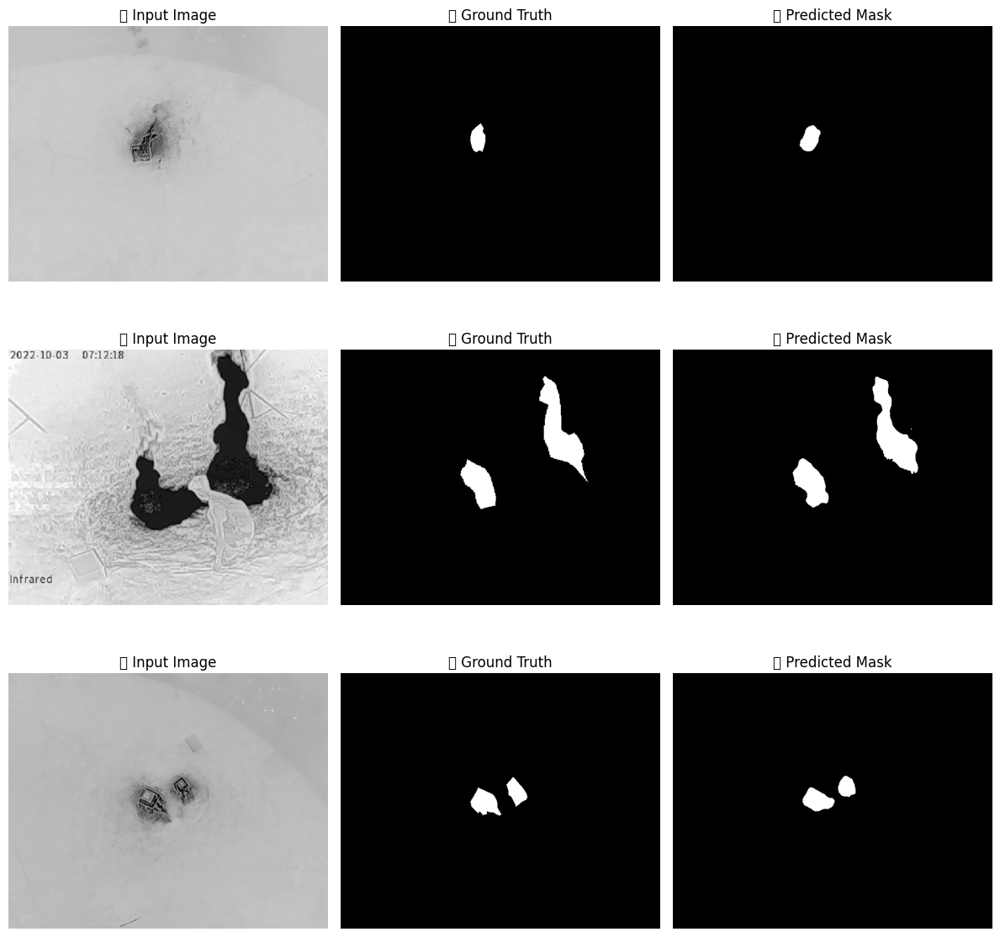

In [ ]:
model.load_state_dict(torch.load("best_model.pth", map_location=DEVICE))
model.eval()

def visualize_predictions(model, dataloader, num_samples=3):
    model.eval()
    images_shown = 0

    plt.figure(figsize=(12, num_samples * 4))

    with torch.no_grad():
        for imgs, masks in dataloader:
            imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
            outputs = model(imgs)
            preds = torch.sigmoid(outputs)
            preds = (preds > 0.5).float()

            for i in range(imgs.size(0)):
                if images_shown >= num_samples:
                    break
                img = imgs[i].cpu().numpy().transpose(1, 2, 0)
                mask = masks[i].cpu().squeeze().numpy()
                pred = preds[i].cpu().squeeze().numpy()


                img = (img - img.min()) / (img.max() - img.min() + 1e-6)


                plt.subplot(num_samples, 3, images_shown * 3 + 1)
                plt.imshow(img)
                plt.title(" Input Image")
                plt.axis("off")

                plt.subplot(num_samples, 3, images_shown * 3 + 2)
                plt.imshow(mask, cmap="gray")
                plt.title(" Ground Truth")
                plt.axis("off")

                plt.subplot(num_samples, 3, images_shown * 3 + 3)
                plt.imshow(pred, cmap="gray")
                plt.title(" Predicted Mask")
                plt.axis("off")

                images_shown += 1
            if images_shown >= num_samples:
                break

    plt.tight_layout()
    plt.show()

visualize_predictions(model, val_loader, num_samples=3)


Test Dice: 0.7974


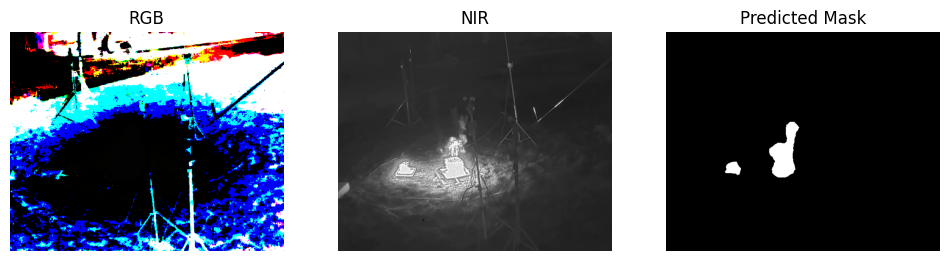

Test Dice: 0.9275


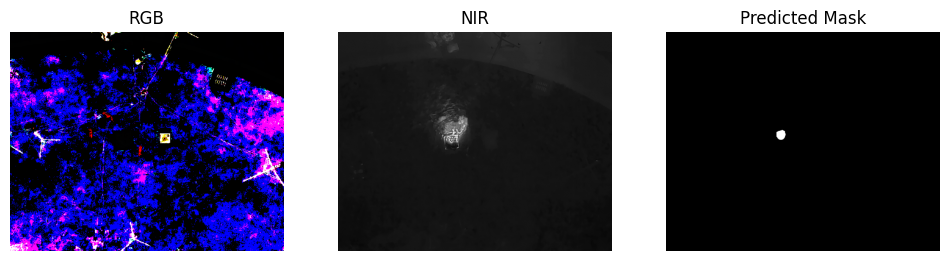

Test Dice: 0.7727


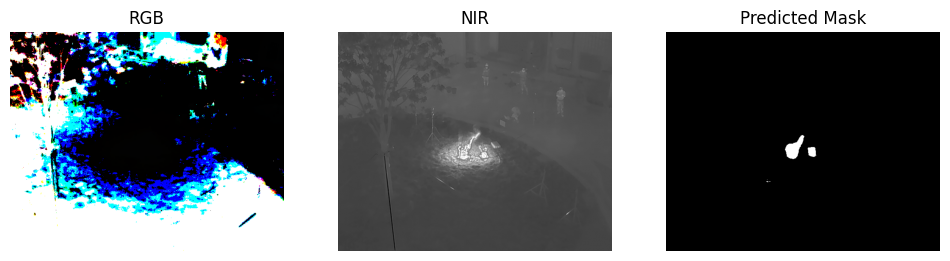

Test Dice: 0.7529


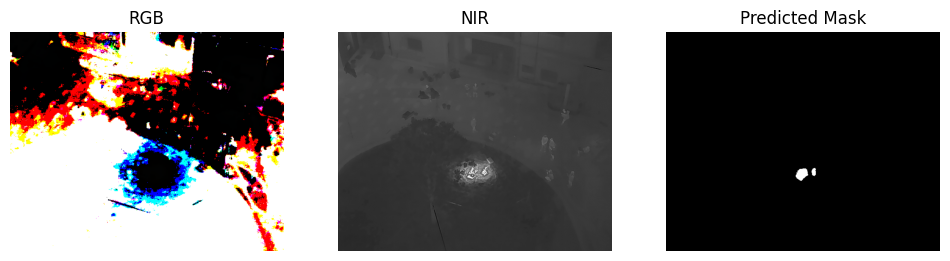

Test Dice: 0.8377


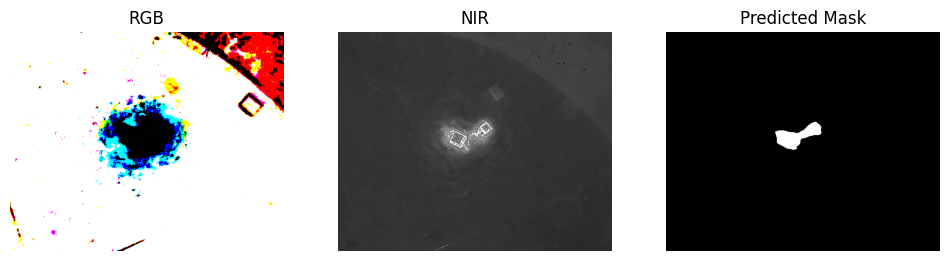

Test Dice: 0.7748


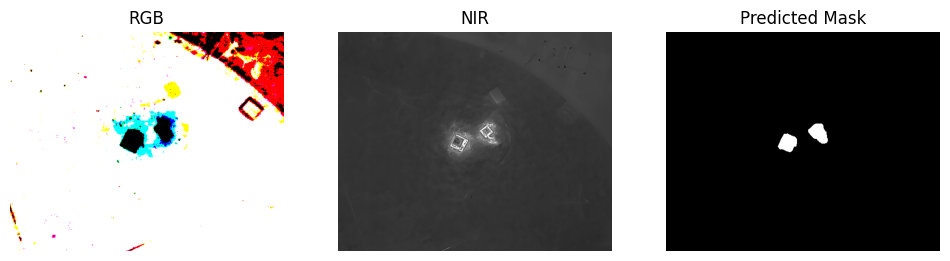

Test Dice: 0.9160


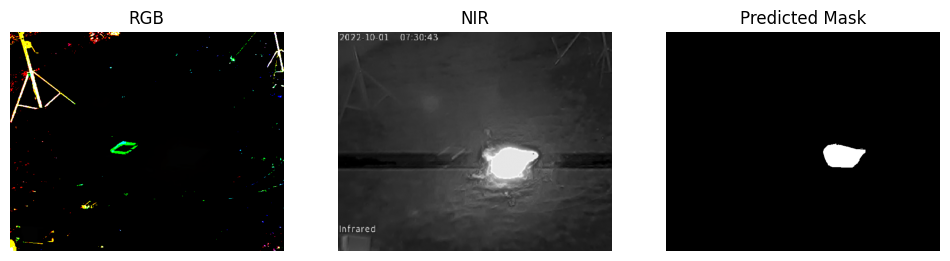

Test Dice: 0.7338


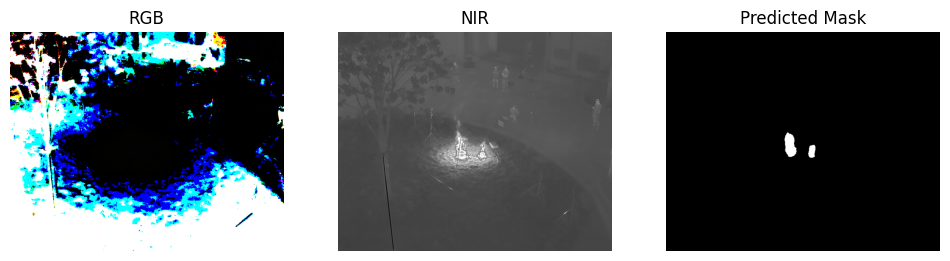

Test Dice: 0.7352


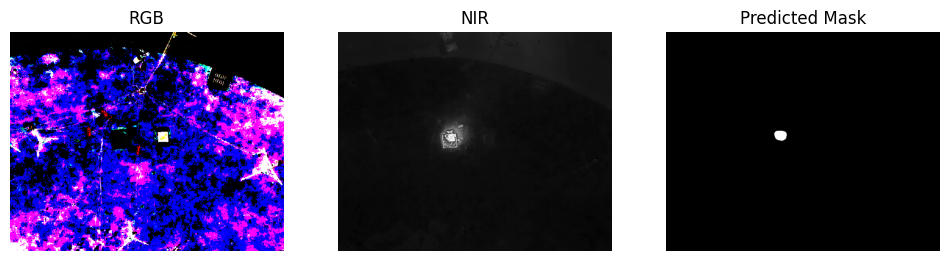

Test Dice: 0.8311


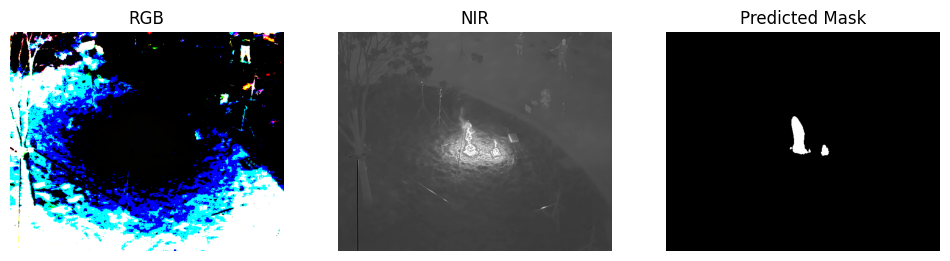

Test Dice: 0.8152


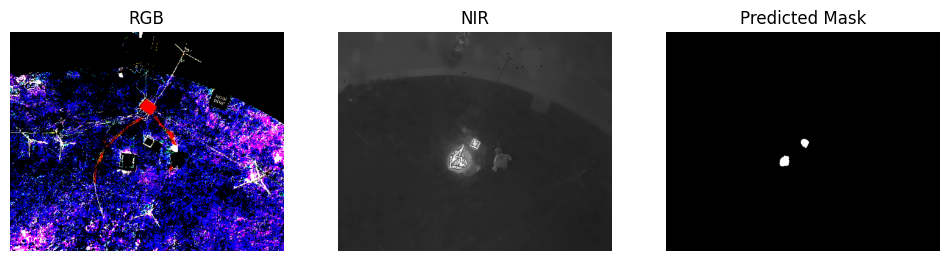

Test Dice: 0.6655


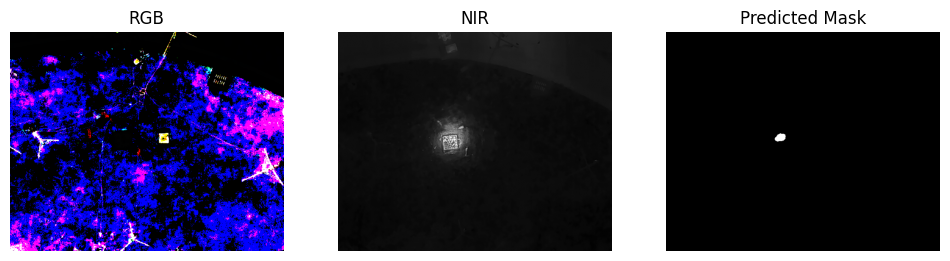

Test Dice: 0.7472


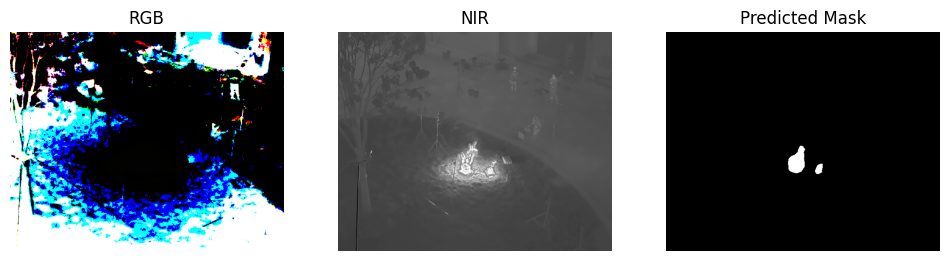

Test Dice: 0.7997


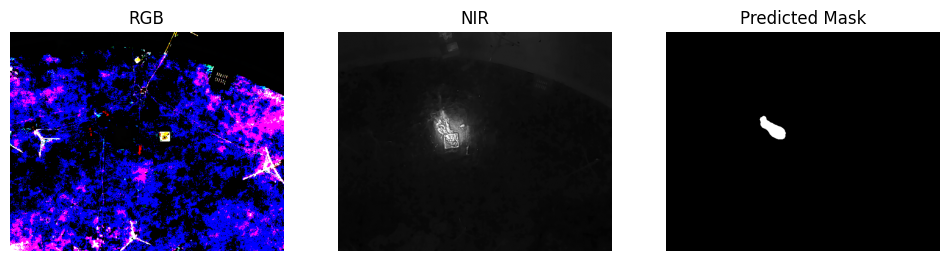

Test Dice: 0.8692


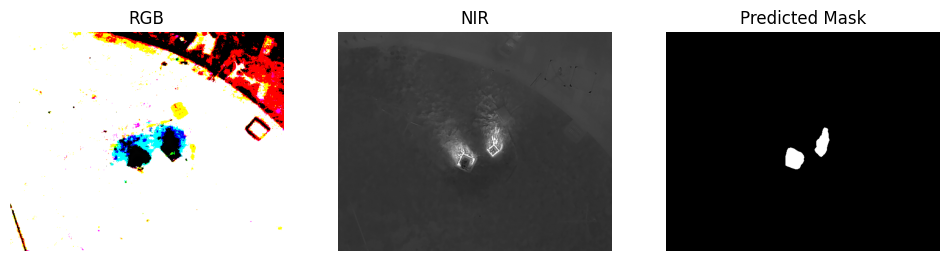

Test Dice: 0.5363


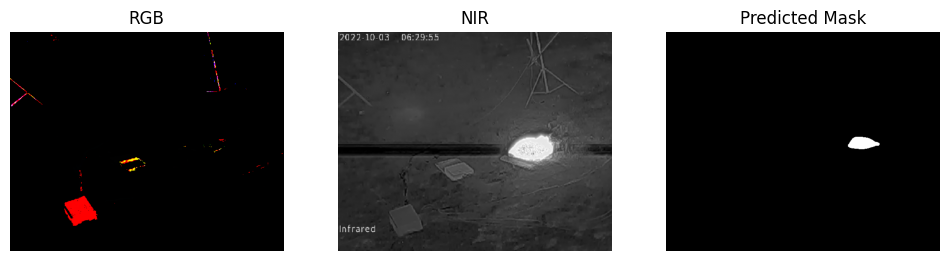

Test Dice: 0.8508


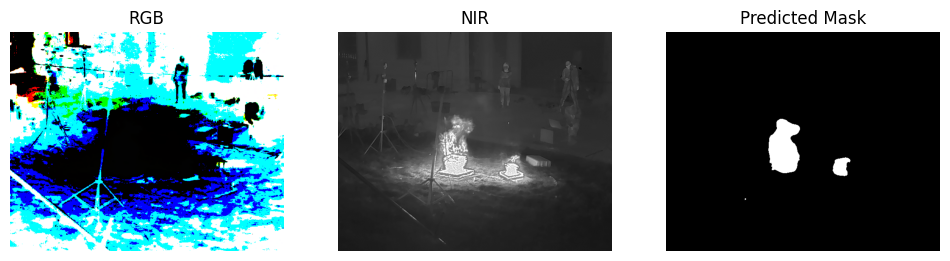

Test Dice: 0.8015


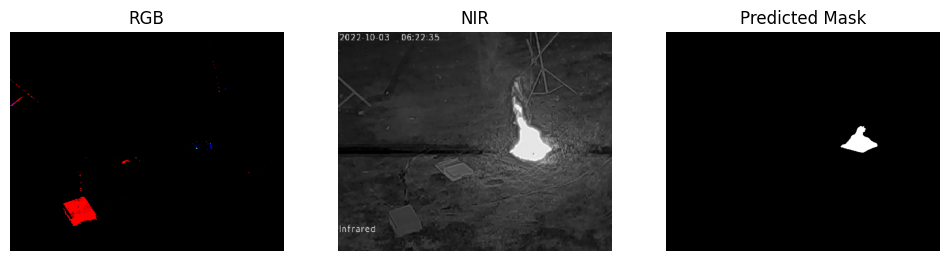

Test Dice: 0.8332


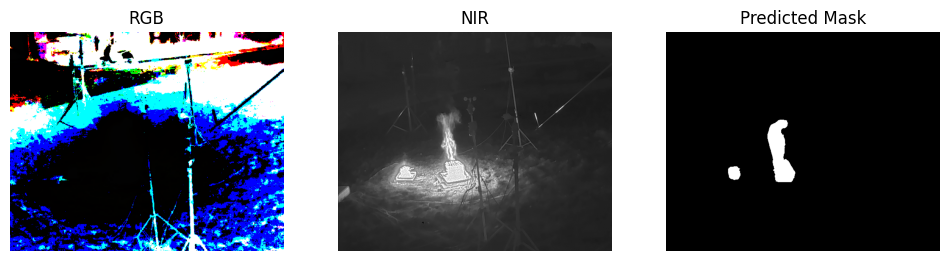

Test Dice: 0.7994


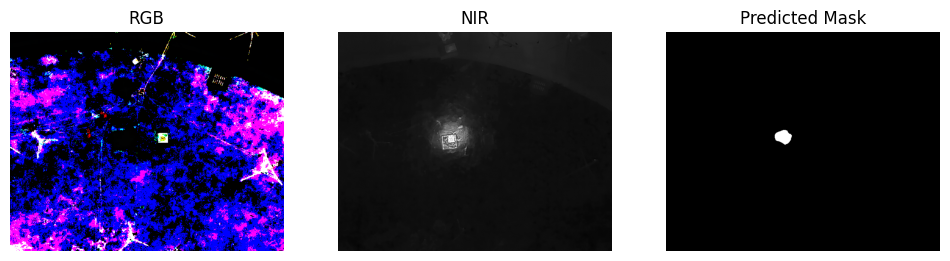

Test Dice: 0.7511


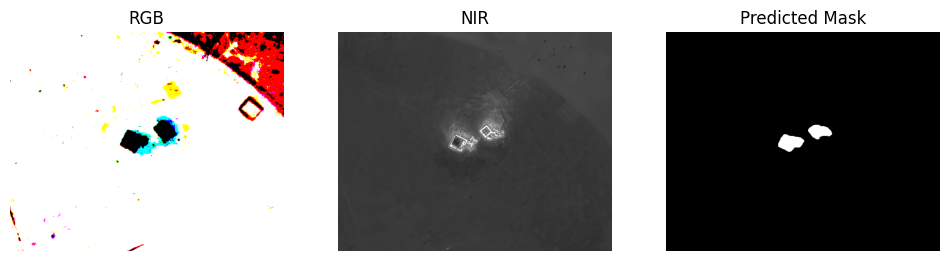

Test Dice: 0.8190


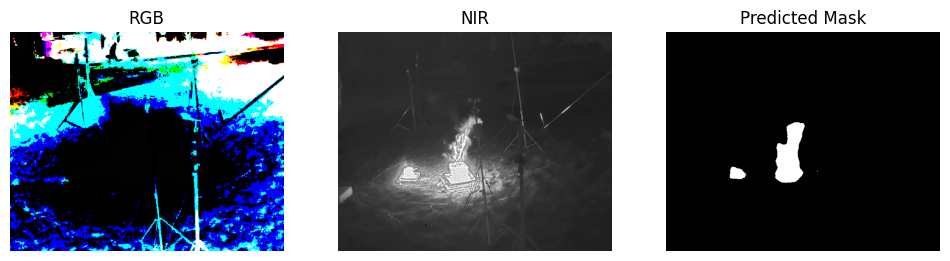

Test Dice: 0.8859


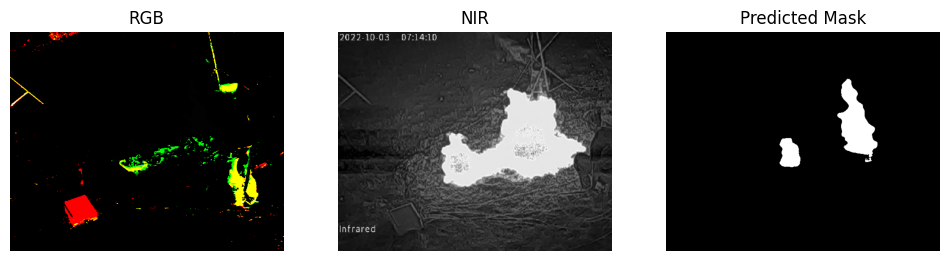

Test Dice: 0.8275


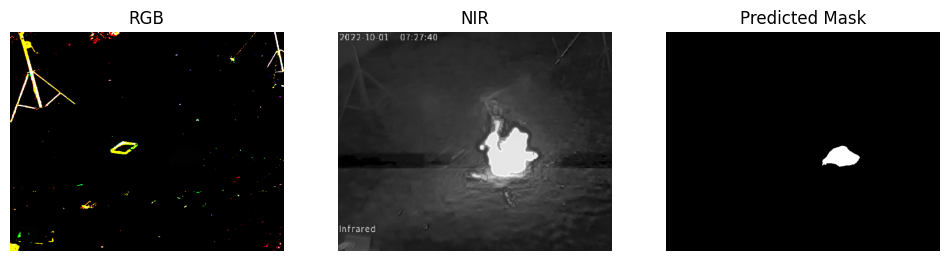

Test Dice: 0.5479


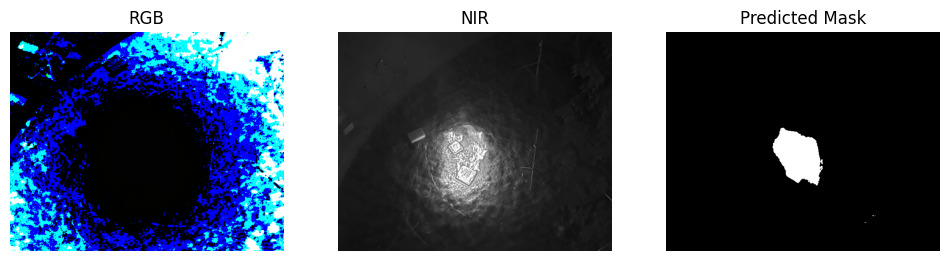

Test Dice: 0.7348


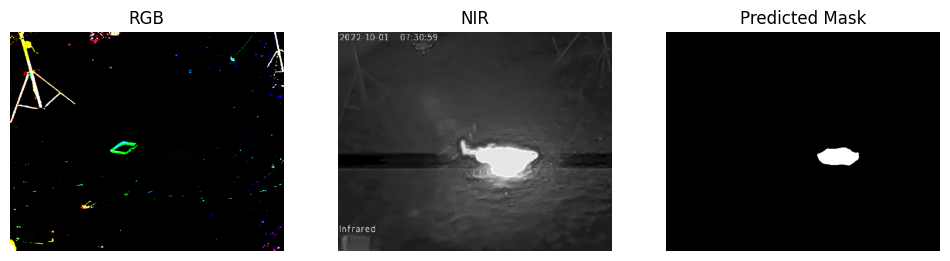

Test Dice: 0.7658


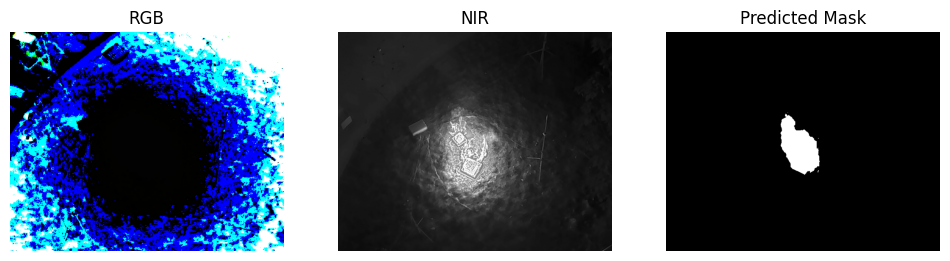

Test Dice: 0.7459


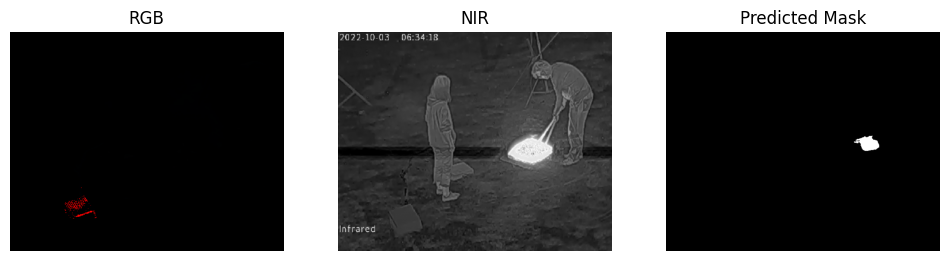

Test Dice: 0.6712


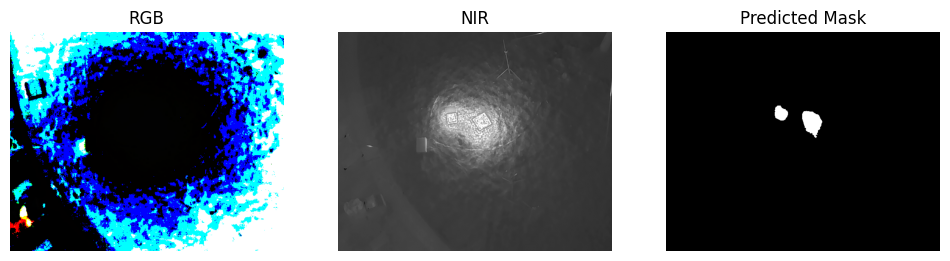

Test Dice: 0.5560


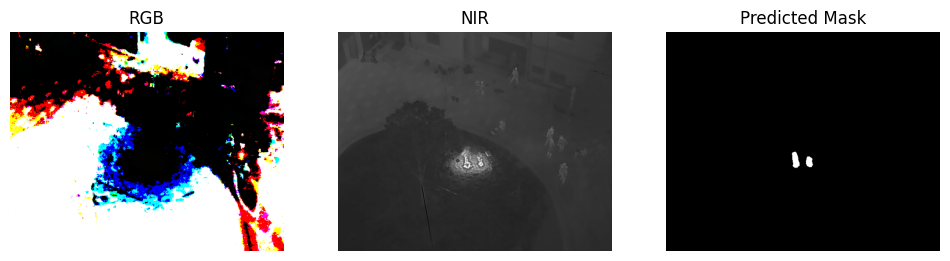

Test Dice: 0.8314


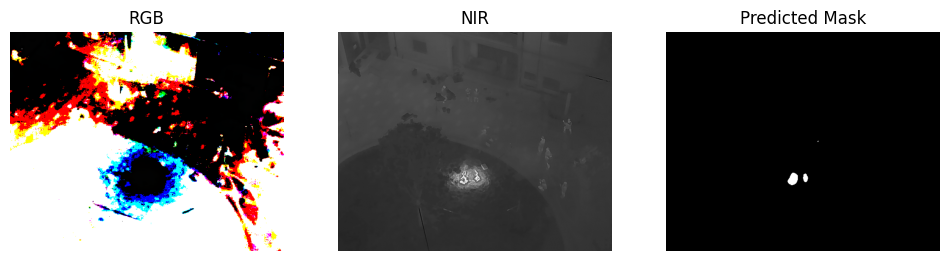

Test Dice: 0.8701


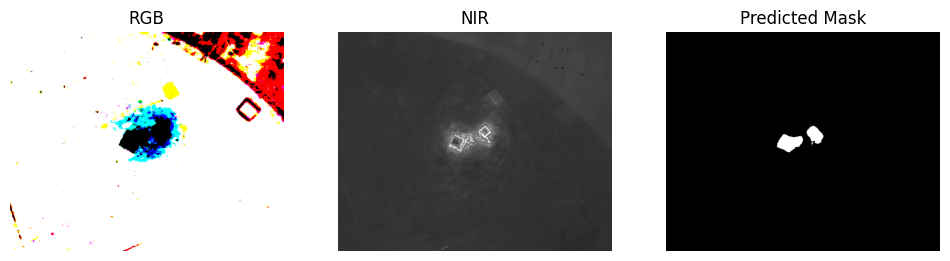

Test Dice: 0.8552


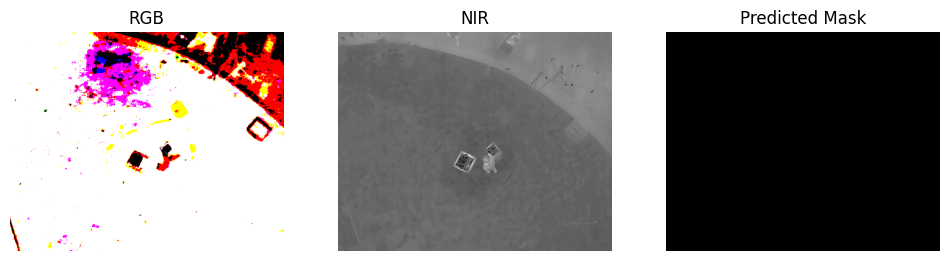

Test Dice: 0.8287


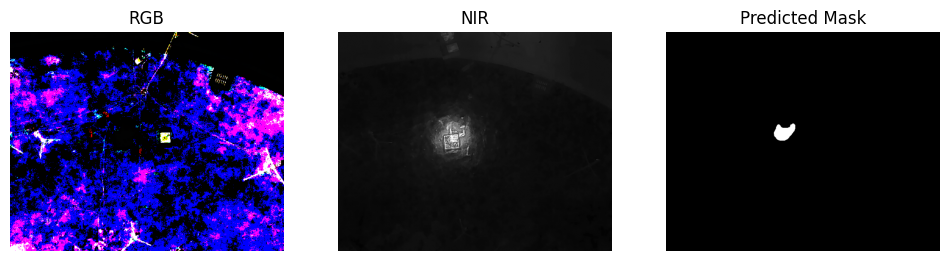

Test Dice: 0.8777


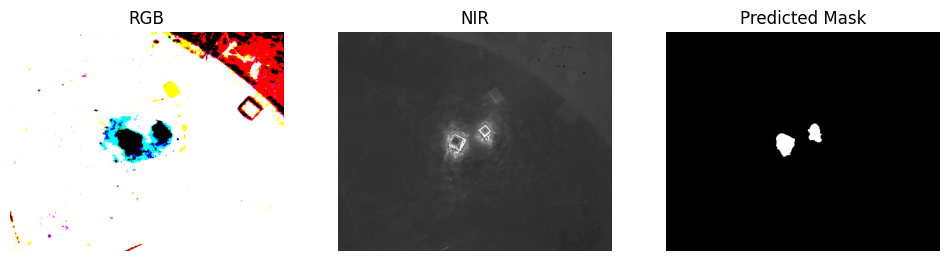

Test Dice: 0.8600


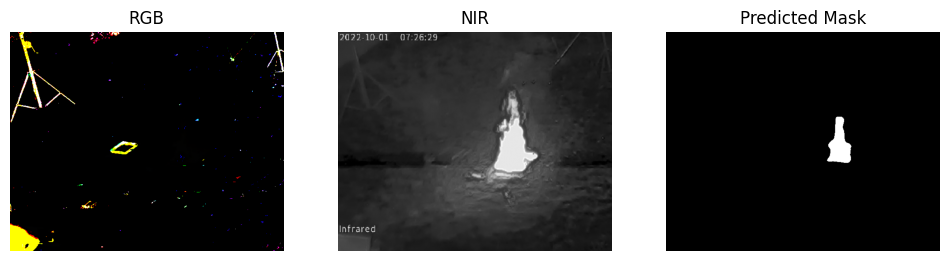

Test Dice: 0.6923


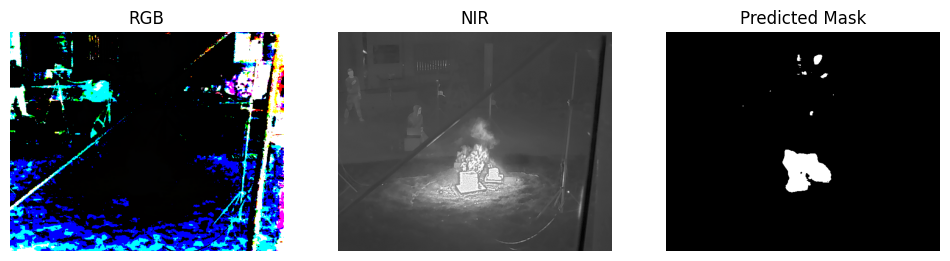

Test Dice: 0.7918


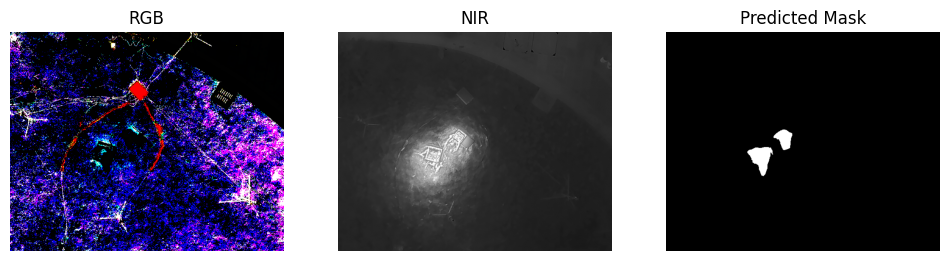

Test Dice: 0.6728


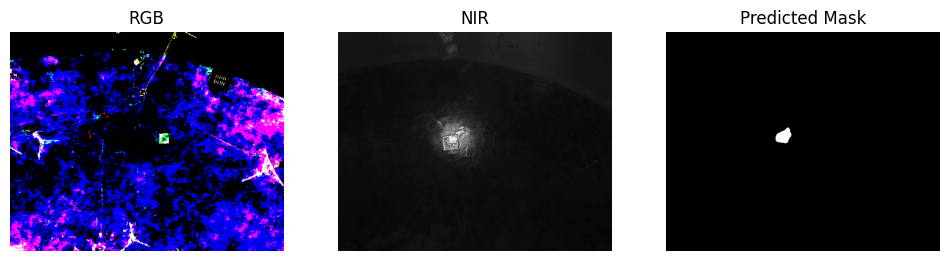

Test Dice: 0.7605


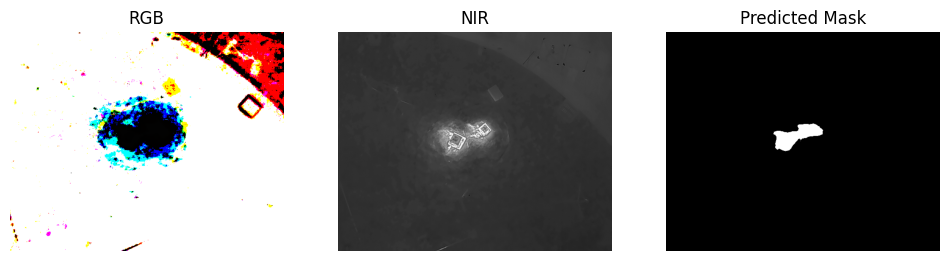

Test Dice: 0.8445


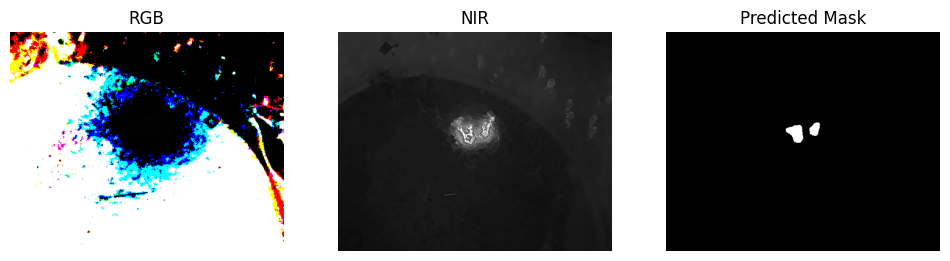

Test Dice: 0.7758


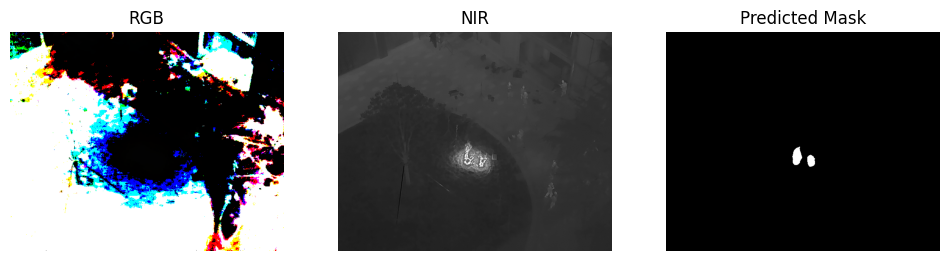

Test Dice: 0.8813


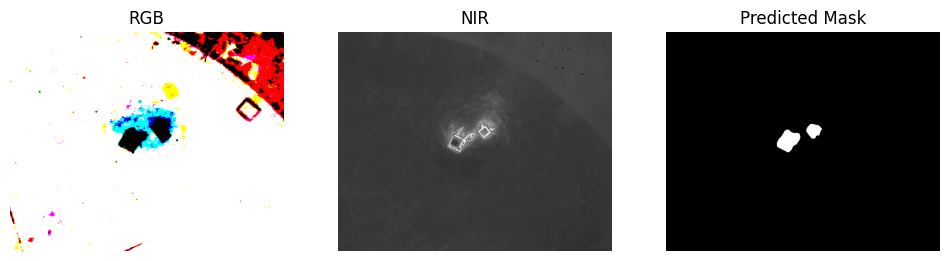

Test Dice: 0.8697


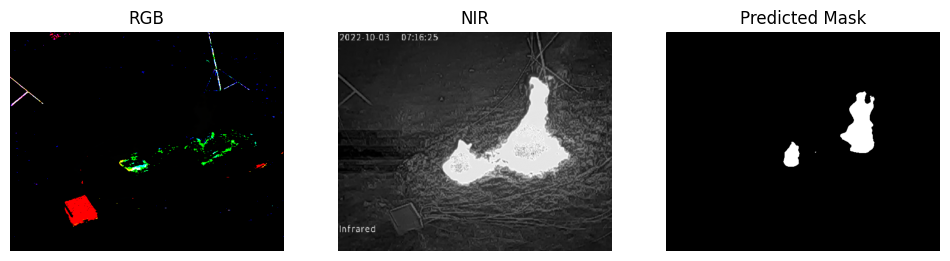

Test Dice: 0.7980


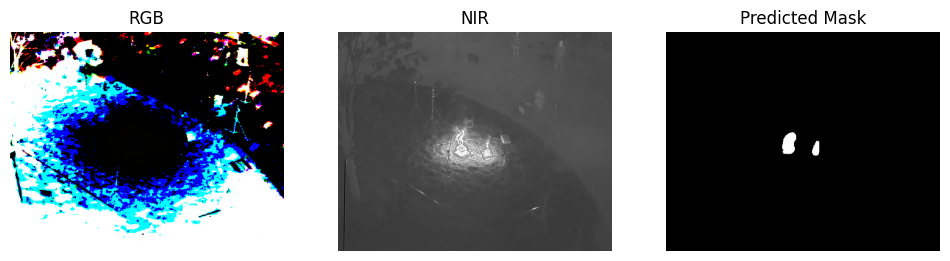

Test Dice: 0.8585


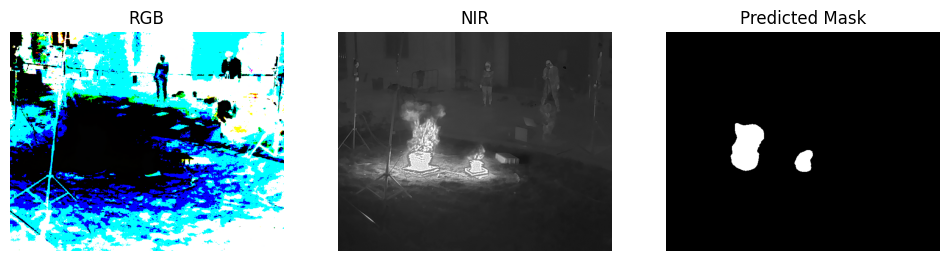

Test Dice: 0.7535


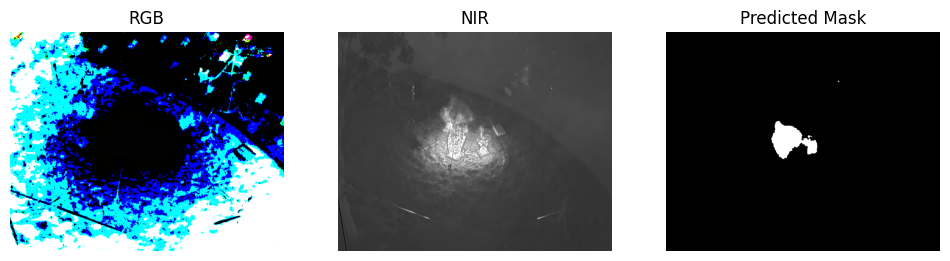

Test Dice: 0.7681


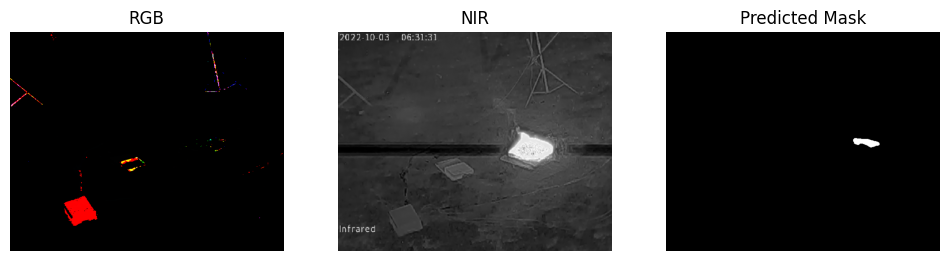

Test Dice: 0.6973


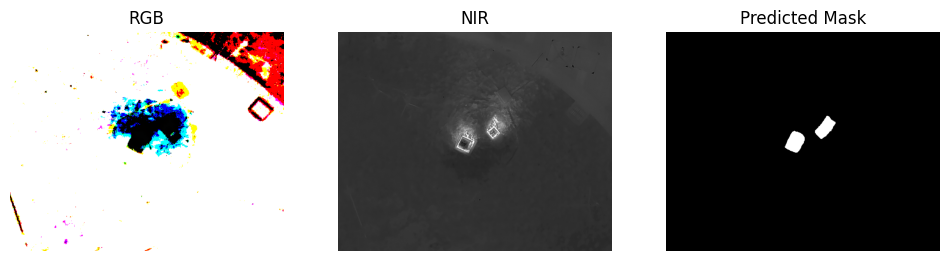

Test Dice: 0.9163


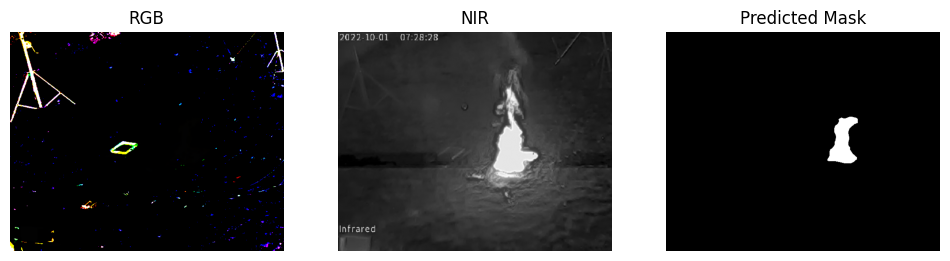

Test Dice: 0.8147


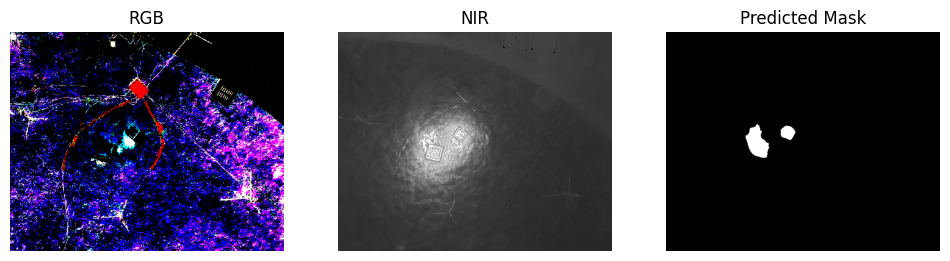

Test Dice: 0.7956


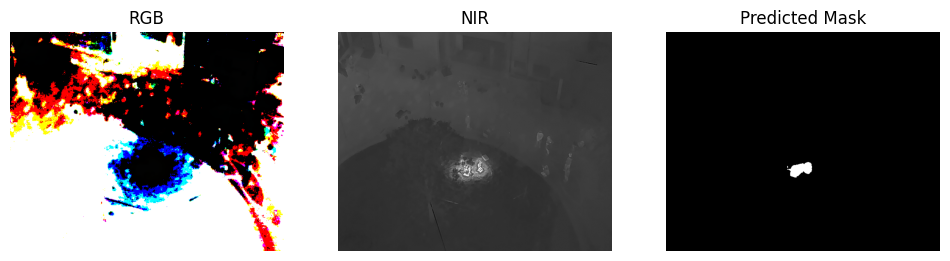

Test Dice: 0.8218


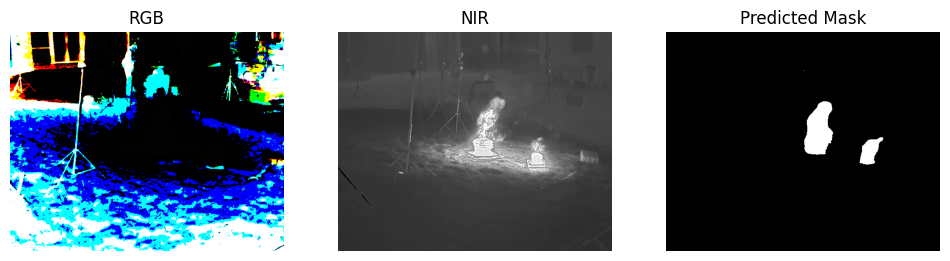

Test Dice: 0.8106


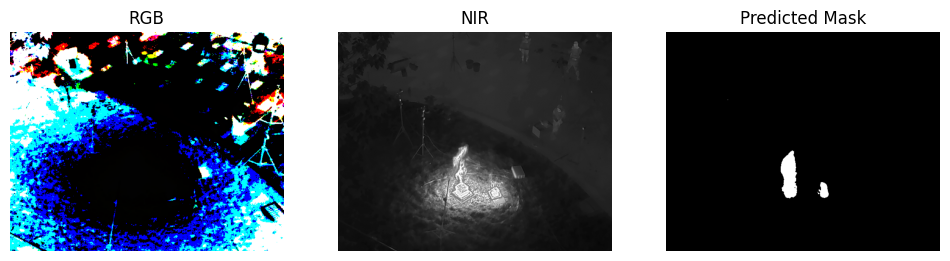

Test Dice: 0.7513


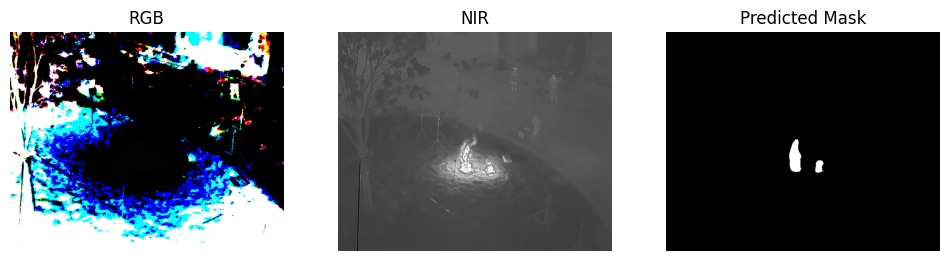

Test Dice: 0.7048


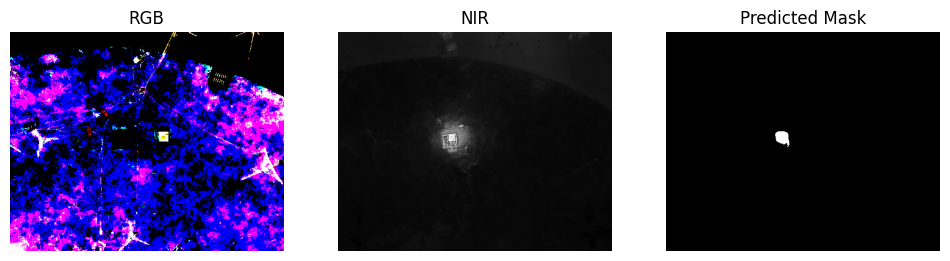

Test Dice: 0.7153


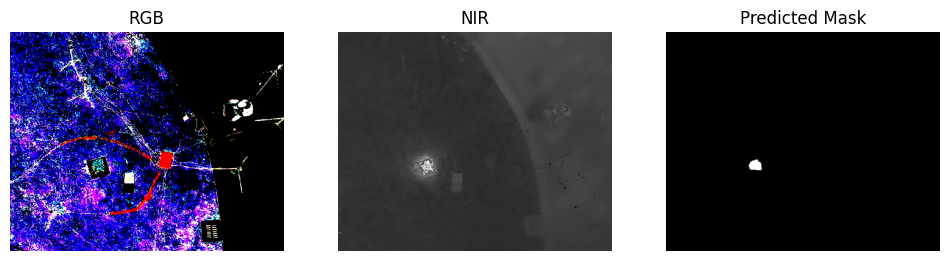

Test Dice: 0.7505


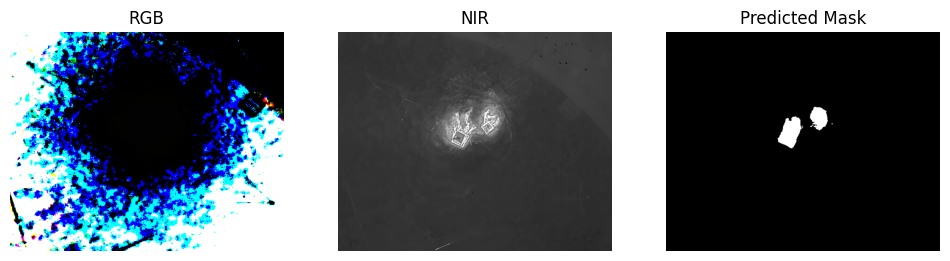

Test Dice: 0.5883


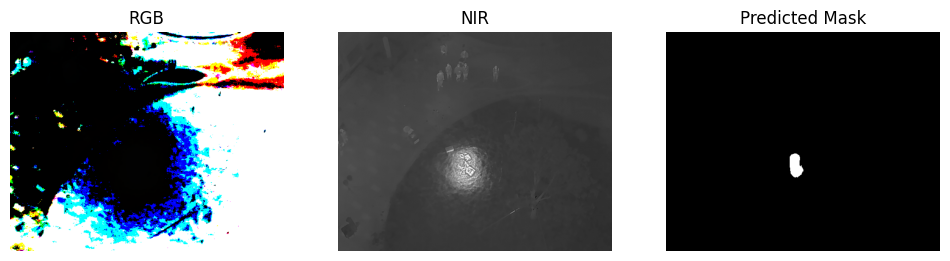

Test Dice: 0.6942


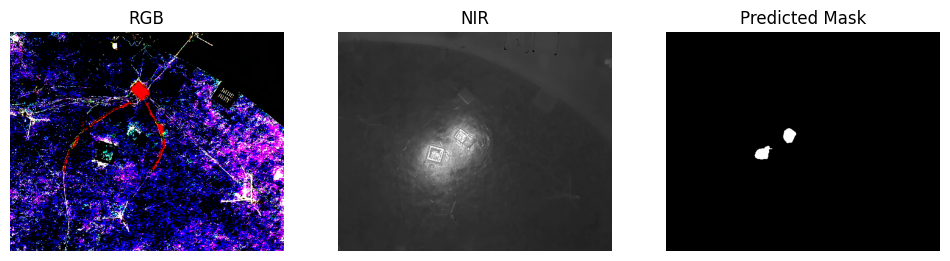

Test Dice: 0.7277


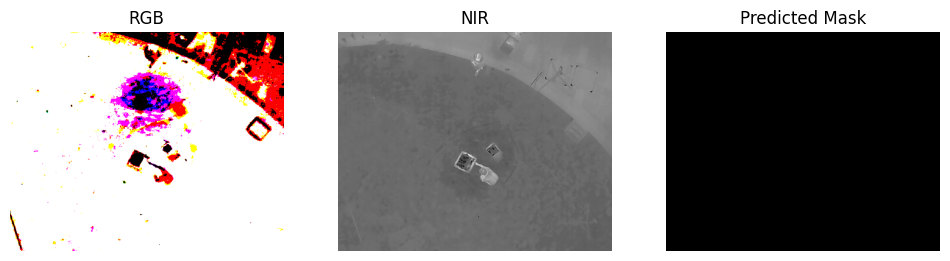

Test Dice: 0.8015


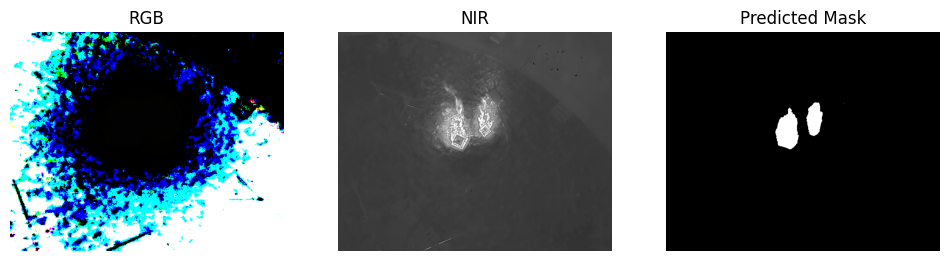

Test Dice: 0.8425


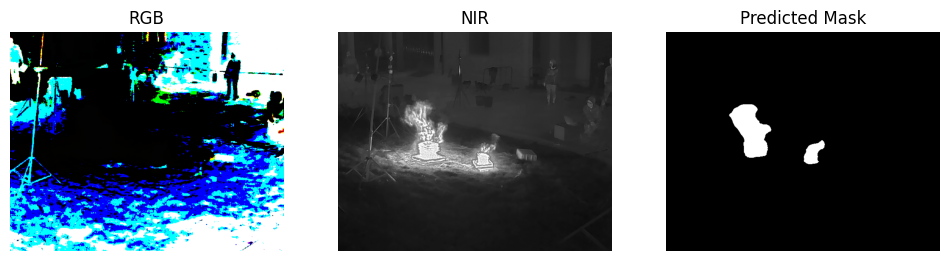

Test Dice: 0.7667


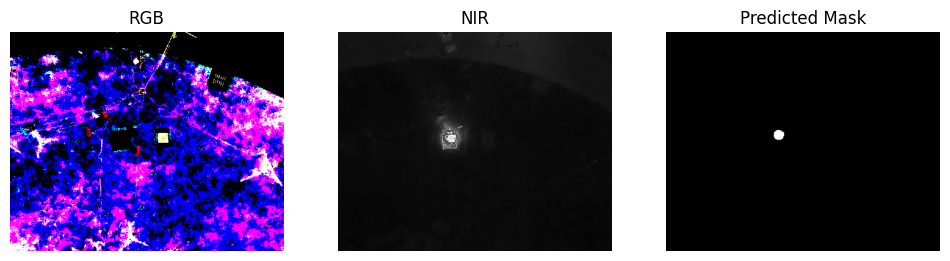

Test Dice: 0.7689


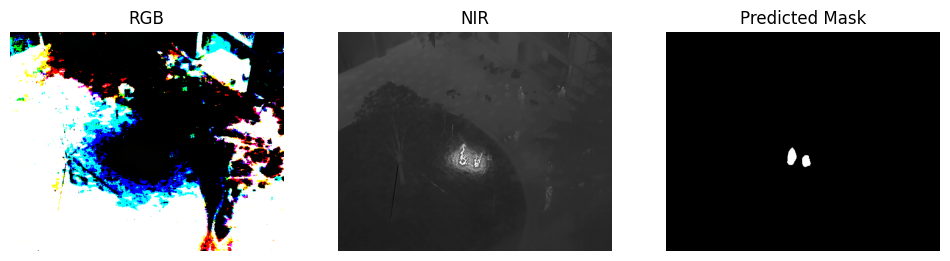

Test Dice: 0.6736


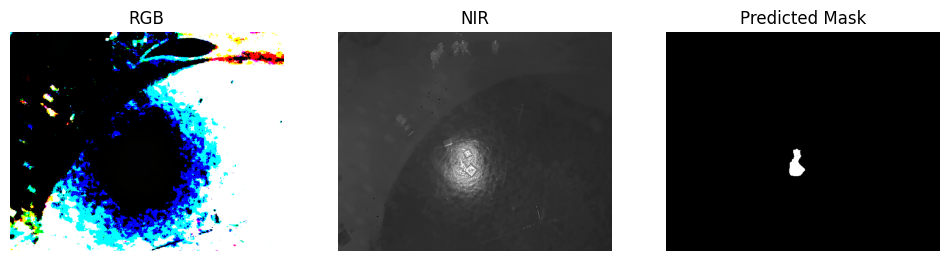

Test Dice: 0.7567


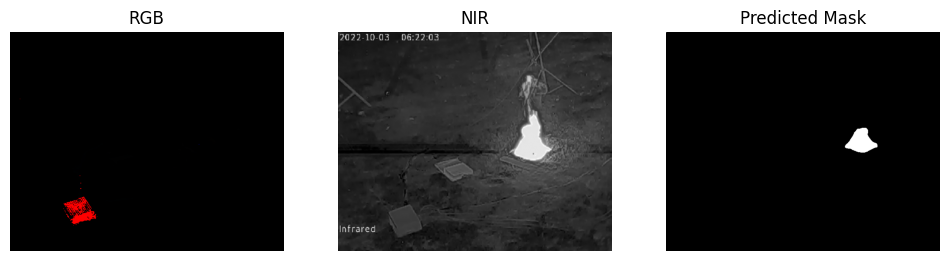

Test Dice: 0.7090


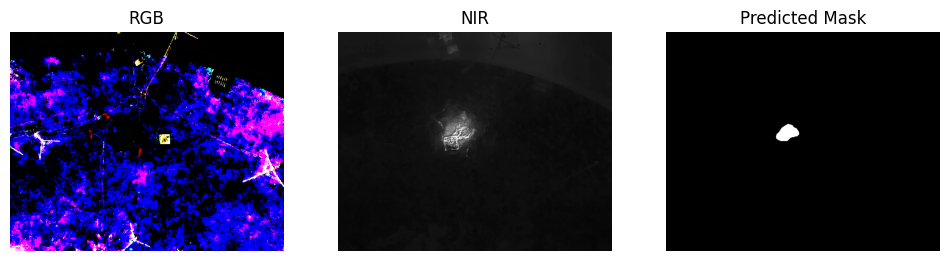

Test Dice: 0.6884


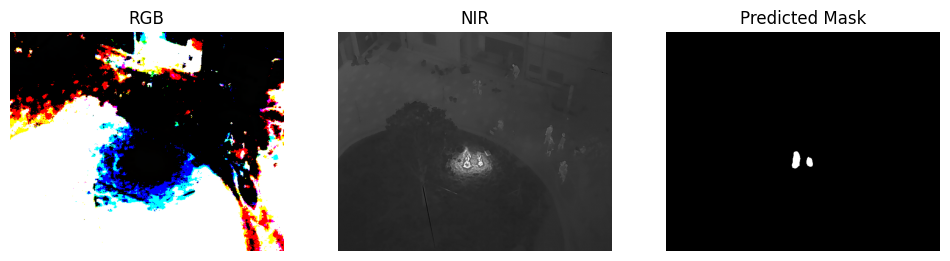

In [ ]:
model.eval()
with torch.no_grad():
    for imgs, masks in test_loader:
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        outputs = model(imgs)
        dice = dice_coef(outputs, masks).item()
        print(f"Test Dice: {dice:.4f}")

        img = imgs[0].cpu().numpy().transpose(1,2,0)
        rgb, nir = img[...,:3].astype(np.uint8), img[...,3]
        mask_pred = (torch.sigmoid(outputs[0,0])>0.5).cpu().numpy()
        mask_true = masks[0,0].cpu().numpy()

        plt.figure(figsize=(12,4))
        plt.subplot(1,3,1); plt.imshow(rgb); plt.title("RGB"); plt.axis('off')
        plt.subplot(1,3,2); plt.imshow(nir, cmap='gray'); plt.title("NIR"); plt.axis('off')
        plt.subplot(1,3,3); plt.imshow(mask_pred, cmap='gray'); plt.title("Predicted Mask"); plt.axis('off')
        plt.show()


In [ ]:
dice_scores = []
with torch.no_grad():
    for imgs, masks in test_loader:
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        outputs = model(imgs)
        dice_scores.append(dice_coef(outputs, masks).item())

print("Average Test Dice:", np.mean(dice_scores))


Average Test Dice: 0.7751844413038613


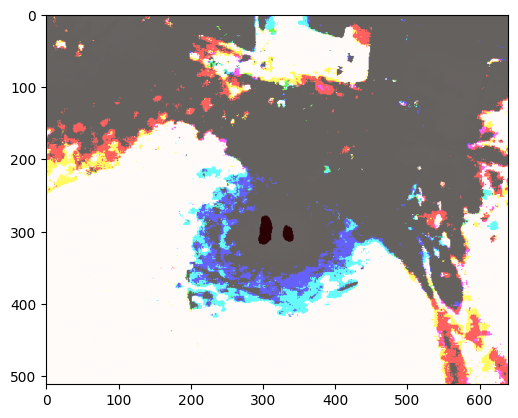

In [ ]:
plt.imshow(rgb)
plt.imshow(mask_pred, alpha=0.4, cmap='Reds')
plt.show()


In [ ]:
torch.save(model.state_dict(), "rgbt_unet.pth")


Confusion Matrix:
 [[44422780    99986]
 [   55637   313757]]


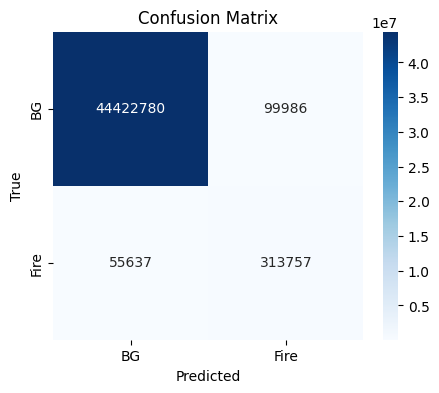

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for imgs, masks in test_loader:
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        outputs = torch.sigmoid(model(imgs))
        preds = (outputs > 0.5).int()

        all_preds.append(preds.cpu().numpy().reshape(-1))
        all_labels.append(masks.cpu().numpy().reshape(-1))

all_preds = np.concatenate(all_preds)
all_labels = np.concatenate(all_labels)

cm = confusion_matrix(all_labels, all_preds)
print("Confusion Matrix:\n", cm)
plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['BG','Fire'], yticklabels=['BG','Fire'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, jaccard_score

accuracy  = accuracy_score(all_labels, all_preds)
precision = precision_score(all_labels, all_preds)
recall    = recall_score(all_labels, all_preds)
f1        = f1_score(all_labels, all_preds)
iou       = jaccard_score(all_labels, all_preds)

print(f"Accuracy : {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall   : {recall:.4f}")
print(f"F1-score : {f1:.4f}")
print(f"IoU      : {iou:.4f}")


Accuracy : 0.9965
Precision: 0.7583
Recall   : 0.8494
F1-score : 0.8013
IoU      : 0.6684


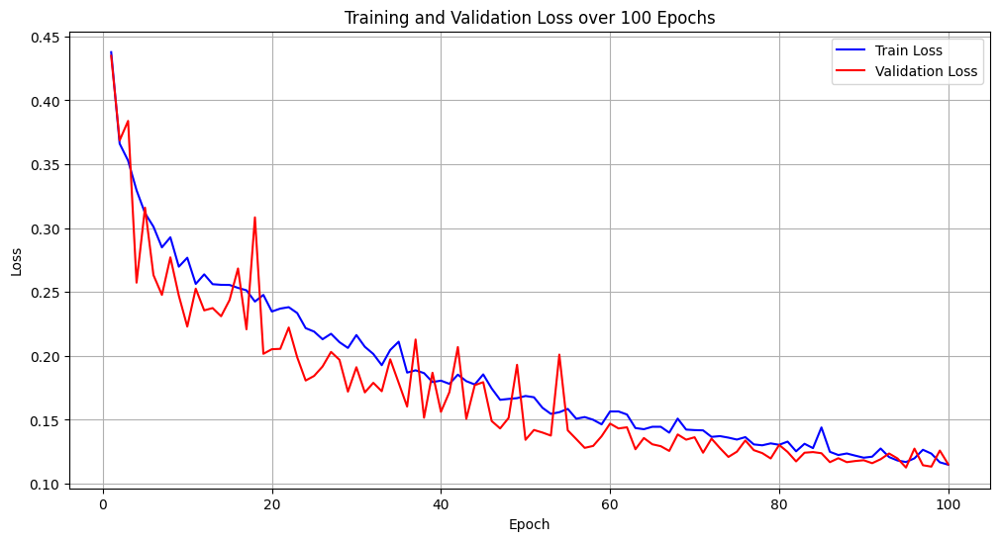

In [ ]:
import matplotlib.pyplot as plt
train_losses = [
    0.4377, 0.3661, 0.3528, 0.3296, 0.3117, 0.3011, 0.2849, 0.2928, 0.2698, 0.2768,
    0.2563, 0.2638, 0.2561, 0.2556, 0.2555, 0.2532, 0.2513, 0.2425, 0.2477, 0.2347,
    0.2370, 0.2381, 0.2335, 0.2217, 0.2190, 0.2130, 0.2173, 0.2107, 0.2062, 0.2163,
    0.2071, 0.2015, 0.1927, 0.2046, 0.2111, 0.1869, 0.1887, 0.1865, 0.1795, 0.1806,
    0.1781, 0.1853, 0.1802, 0.1776, 0.1855, 0.1745, 0.1656, 0.1663, 0.1669, 0.1686,
    0.1676, 0.1594, 0.1546, 0.1559, 0.1585, 0.1508, 0.1521, 0.1500, 0.1464, 0.1565,
    0.1565, 0.1541, 0.1435, 0.1426, 0.1445, 0.1445, 0.1399, 0.1509, 0.1423, 0.1419,
    0.1417, 0.1366, 0.1372, 0.1360, 0.1345, 0.1364, 0.1307, 0.1300, 0.1315, 0.1304,
    0.1329, 0.1253, 0.1312, 0.1278, 0.1440, 0.1249, 0.1224, 0.1236, 0.1219, 0.1203,
    0.1211, 0.1275, 0.1208, 0.1181, 0.1169, 0.1198, 0.1265, 0.1235, 0.1167, 0.1148
]

val_losses = [
    0.4348, 0.3686, 0.3839, 0.2573, 0.3160, 0.2632, 0.2477, 0.2771, 0.2471, 0.2229,
    0.2526, 0.2356, 0.2374, 0.2310, 0.2437, 0.2684, 0.2208, 0.3084, 0.2016, 0.2052,
    0.2055, 0.2222, 0.1989, 0.1807, 0.1843, 0.1917, 0.2031, 0.1969, 0.1720, 0.1911,
    0.1714, 0.1789, 0.1723, 0.1973, 0.1789, 0.1603, 0.2128, 0.1516, 0.1868, 0.1562,
    0.1716, 0.2069, 0.1507, 0.1771, 0.1794, 0.1490, 0.1432, 0.1514, 0.1930, 0.1343,
    0.1420, 0.1400, 0.1376, 0.2010, 0.1417, 0.1349, 0.1280, 0.1295, 0.1371, 0.1470,
    0.1432, 0.1441, 0.1269, 0.1357, 0.1308, 0.1293, 0.1256, 0.1385, 0.1344, 0.1363,
    0.1242, 0.1352, 0.1278, 0.1209, 0.1250, 0.1338, 0.1262, 0.1239, 0.1197, 0.1303,
    0.1248, 0.1174, 0.1242, 0.1247, 0.1238, 0.1168, 0.1199, 0.1168, 0.1177, 0.1183,
    0.1160, 0.1191, 0.1236, 0.1197, 0.1126, 0.1274, 0.1144, 0.1133, 0.1259, 0.1151
]

epochs = list(range(1, 101))
plt.figure(figsize=(12,6))
plt.plot(epochs, train_losses, 'b-', label='Train Loss')
plt.plot(epochs, val_losses, 'r-', label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss over 100 Epochs')
plt.legend()
plt.grid(True)
plt.show()


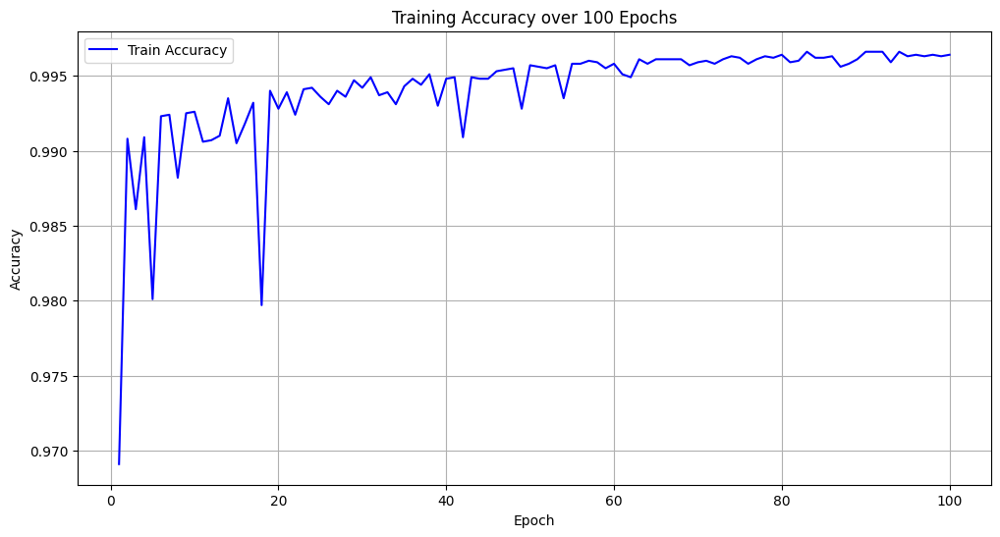

In [ ]:
epochs = list(range(1, 101))

train_acc = [
    0.9691, 0.9908, 0.9861, 0.9909, 0.9801, 0.9923, 0.9924, 0.9882, 0.9925, 0.9926,
    0.9906, 0.9907, 0.9910, 0.9935, 0.9905, 0.9918, 0.9932, 0.9797, 0.9940, 0.9928,
    0.9939, 0.9924, 0.9941, 0.9942, 0.9936, 0.9931, 0.9940, 0.9936, 0.9947, 0.9942,
    0.9949, 0.9937, 0.9939, 0.9931, 0.9943, 0.9948, 0.9944, 0.9951, 0.9930, 0.9948,
    0.9949, 0.9909, 0.9949, 0.9948, 0.9948, 0.9953, 0.9954, 0.9955, 0.9928, 0.9957,
    0.9956, 0.9955, 0.9957, 0.9935, 0.9958, 0.9958, 0.9960, 0.9959, 0.9955, 0.9958,
    0.9951, 0.9949, 0.9961, 0.9958, 0.9961, 0.9961, 0.9961, 0.9961, 0.9957, 0.9959,
    0.9960, 0.9958, 0.9961, 0.9963, 0.9962, 0.9958, 0.9961, 0.9963, 0.9962, 0.9964,
    0.9959, 0.9960, 0.9966, 0.9962, 0.9962, 0.9963, 0.9956, 0.9958, 0.9961, 0.9966,
    0.9966, 0.9966, 0.9959, 0.9966, 0.9963, 0.9964, 0.9963, 0.9964, 0.9963, 0.9964
]

plt.figure(figsize=(12,6))
plt.plot(epochs, train_acc, 'b-', label='Train Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training Accuracy over 100 Epochs')
plt.legend()
plt.grid(True)
plt.show()


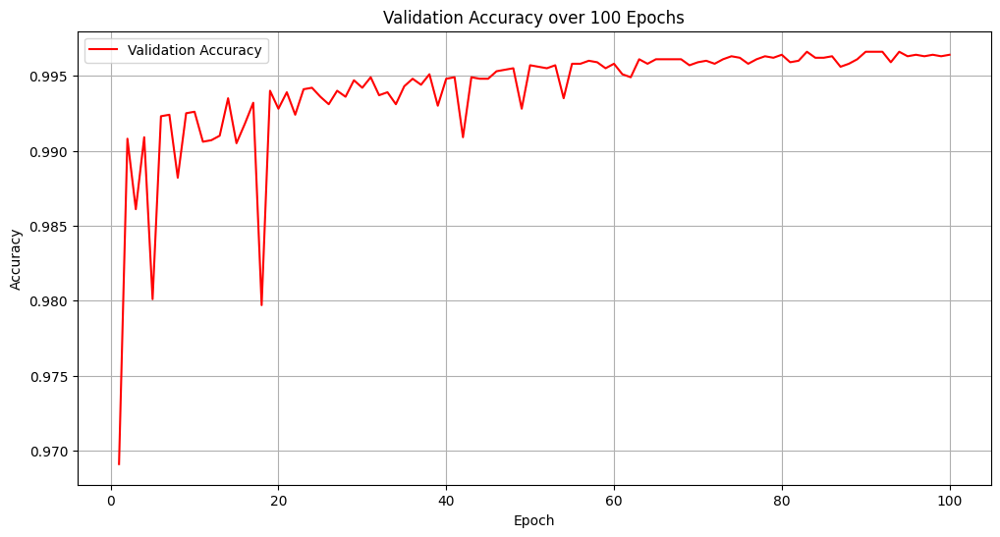

In [ ]:
epochs = list(range(1, 101))

val_acc = [
    0.9691, 0.9908, 0.9861, 0.9909, 0.9801, 0.9923, 0.9924, 0.9882, 0.9925, 0.9926,
    0.9906, 0.9907, 0.9910, 0.9935, 0.9905, 0.9918, 0.9932, 0.9797, 0.9940, 0.9928,
    0.9939, 0.9924, 0.9941, 0.9942, 0.9936, 0.9931, 0.9940, 0.9936, 0.9947, 0.9942,
    0.9949, 0.9937, 0.9939, 0.9931, 0.9943, 0.9948, 0.9944, 0.9951, 0.9930, 0.9948,
    0.9949, 0.9909, 0.9949, 0.9948, 0.9948, 0.9953, 0.9954, 0.9955, 0.9928, 0.9957,
    0.9956, 0.9955, 0.9957, 0.9935, 0.9958, 0.9958, 0.9960, 0.9959, 0.9955, 0.9958,
    0.9951, 0.9949, 0.9961, 0.9958, 0.9961, 0.9961, 0.9961, 0.9961, 0.9957, 0.9959,
    0.9960, 0.9958, 0.9961, 0.9963, 0.9962, 0.9958, 0.9961, 0.9963, 0.9962, 0.9964,
    0.9959, 0.9960, 0.9966, 0.9962, 0.9962, 0.9963, 0.9956, 0.9958, 0.9961, 0.9966,
    0.9966, 0.9966, 0.9959, 0.9966, 0.9963, 0.9964, 0.9963, 0.9964, 0.9963, 0.9964
]
plt.figure(figsize=(12,6))
plt.plot(epochs, val_acc, 'r-', label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Validation Accuracy over 100 Epochs')
plt.legend()
plt.grid(True)
plt.show()
